## Ganesh Lokare
### Mail : lokaregns@gmail.com

In [42]:
using_colab = True

In [43]:
cd "/content/drive/MyDrive/paralleldots/"

/content/drive/MyDrive/paralleldots


# Download model

In [50]:
if using_colab:
    import torch
    import torchvision
    print("PyTorch version:", torch.__version__)
    print("Torchvision version:", torchvision.__version__)
    print("CUDA is available:", torch.cuda.is_available())
    import sys
    !{sys.executable} -m pip install opencv-python matplotlib
    !{sys.executable} -m pip install 'git+https://github.com/facebookresearch/segment-anything-2.git'

    !mkdir -p ../checkpoints/
    !wget -P ../checkpoints/ https://dl.fbaipublicfiles.com/segment_anything_2/072824/sam2_hiera_tiny.pt

PyTorch version: 2.4.0+cu121
Torchvision version: 0.19.0+cu121
CUDA is available: True
  Cloning https://github.com/facebookresearch/segment-anything-2.git to /tmp/pip-req-build-mevqai6i
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/segment-anything-2.git /tmp/pip-req-build-mevqai6i
  Resolved https://github.com/facebookresearch/segment-anything-2.git to commit 7e1596c0b6462eb1d1ba7e1492430fed95023598
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
--2024-09-13 06:09:16--  https://dl.fbaipublicfiles.com/segment_anything_2/072824/sam2_hiera_tiny.pt
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 13.35.18.15, 13.35.18.87, 13.35.18.103, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|13.35.18.15|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 155906050 (149M) [application/vnd.snesdev-page-table]
Saving 

# Download and unzip data

In [51]:
!mkdir -p data
!wget -P data http://www.cs.cmu.edu/~ehsiao/3drecognition/CMU10_3D.zip
!unzip -d data data/CMU10_3D.zip

--2024-09-13 06:09:18--  http://www.cs.cmu.edu/~ehsiao/3drecognition/CMU10_3D.zip
Resolving www.cs.cmu.edu (www.cs.cmu.edu)... 128.2.42.95
Connecting to www.cs.cmu.edu (www.cs.cmu.edu)|128.2.42.95|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 121503865 (116M) [application/zip]
Saving to: ‘data/CMU10_3D.zip’

CMU10_3D.zip        100%[===================>] 115.88M   594KB/s    in 3m 38s  

2024-09-13 06:12:57 (545 KB/s) - ‘data/CMU10_3D.zip’ saved [121503865/121503865]

Archive:  data/CMU10_3D.zip
   creating: data/CMU10_3D/
  inflating: data/CMU10_3D/README.txt  
   creating: data/CMU10_3D/data_3D/
   creating: data/CMU10_3D/modelimages/
   creating: data/CMU10_3D/data_2D/
  inflating: data/CMU10_3D/data_3D/carton_oj_000009.jpg  
  inflating: data/CMU10_3D/data_3D/rice_tuscan_000004.jpg  
  inflating: data/CMU10_3D/data_3D/camera.txt  
  inflating: data/CMU10_3D/data_3D/can_soymilk_000005.jpg  
  inflating: data/CMU10_3D/data_3D/carton_soymilk_3Dgt.txt  
  inf

# Install dependencies

In [52]:
import torch
from sam2.build_sam import build_sam2
from sam2.automatic_mask_generator import SAM2AutomaticMaskGenerator
from sam2.sam2_image_predictor import SAM2ImagePredictor
from sam2.build_sam import build_sam2_video_predictor
from PIL import Image, ImageOps
import numpy as np
import matplotlib.pyplot as plt
import os,glob,shutil
import matplotlib.patches as patches
import glob
import cv2
from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval
from torchvision.ops import masks_to_boxes

# Configure model

In [53]:
checkpoint = "../checkpoints/sam2_hiera_tiny.pt"
model_cfg = "sam2_hiera_t.yaml"

predictor_prompt = SAM2ImagePredictor(build_sam2(model_cfg, checkpoint, device='cuda'))
sam2 = build_sam2(model_cfg, checkpoint, device='cuda', apply_postprocessing=False)
mask_generator = SAM2AutomaticMaskGenerator(sam2)
predictor_vid = build_sam2_video_predictor(model_cfg, checkpoint, device='cuda')

# Define helper functions

In [54]:
def create_if_not_exists(dirname):
  if not os.path.exists(dirname):
    os.mkdir(dirname)

def cleardir(tempfolder):
  filepaths = glob.glob(tempfolder+"/*")
  for filepath in filepaths:
    os.unlink(filepath)

def show_mask(mask, ax, obj_id=None, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        cmap = plt.get_cmap("tab10")
        cmap_idx = 0 if obj_id is None else obj_id
        color = np.array([*cmap(cmap_idx)[:3], 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)


def show_points(coords, labels, ax, marker_size=200):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)


def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0, 0, 0, 0), lw=2))

In [55]:
def track_item_boxes(img_path1, img_path2, img1boxclasslist, visualize=True):
    """Track item boxes in images using SAM2 model."""
    tempfolder = "./tempdir"
    create_if_not_exists(tempfolder)
    cleardir(tempfolder)

    shutil.copy(img_path1, tempfolder + "/00000.jpg")
    shutil.copy(img_path2, tempfolder + "/00001.jpg")

    inference_state = predictor_vid.init_state(video_path="./tempdir")
    predictor_vid.reset_state(inference_state)

    ann_frame_idx = 0
    for img1boxclass in img1boxclasslist:
        ([xmin, xmax, ymin, ymax], objectnumint) = img1boxclass
        box = np.array([xmin, ymin, xmax, ymax], dtype=np.float32)
        _, out_obj_ids, out_mask_logits = predictor_vid.add_new_points_or_box(
            inference_state=inference_state,
            frame_idx=ann_frame_idx,
            obj_id=objectnumint,
            box=box,
        )

    video_segments = {}  # Contains the per-frame segmentation results
    for out_frame_idx, out_obj_ids, out_mask_logits in predictor_vid.propagate_in_video(inference_state):
        video_segments[out_frame_idx] = {
            out_obj_id: (out_mask_logits[i] > 0.0).cpu().numpy()
            for i, out_obj_id in enumerate(out_obj_ids)
        }

    if visualize:

      fig, axes = plt.subplots(1, 2, figsize=(12, 6))  # 1 row, 2 columns

      # First image
      axes[0].set_title("Original image object :")
      axes[0].imshow(Image.open(tempfolder + "/00000.jpg"))
      rect = patches.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, linewidth=1, edgecolor='r', facecolor='none')
      axes[0].add_patch(rect)

      # Second image
      axes[1].set_title("Detected object in test image :")
      axes[1].imshow(Image.open(tempfolder + "/00001.jpg"))
      for out_obj_id, out_mask in video_segments[out_frame_idx].items():
          show_mask(out_mask, axes[1], obj_id=out_obj_id)

      plt.tight_layout()  # Adjust layout to prevent overlap
      plt.show()

    return video_segments

In [56]:
def process_img_png_mask(firstimgpath, firstimgmaskpath, visualize=True):
    # Load the images directly using OpenCV (both original and mask)
    org_img_cv2 = cv2.imread(firstimgpath)  # Original image (BGR format)
    mask_img = cv2.imread(firstimgmaskpath, cv2.IMREAD_GRAYSCALE)  # Mask in grayscale

    # Threshold the mask image to get a binary image
    _, binary = cv2.threshold(mask_img, 254, 255, cv2.THRESH_BINARY)

    # Find contours in the binary image
    contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # If contours exist, find the largest contour and get its bounding box
    if contours:
        contour = max(contours, key=cv2.contourArea)
        x, y, w, h = cv2.boundingRect(contour)
        xmin, ymin, xmax, ymax = x, y, x + w, y + h

        #print(f"Bounding Box - x1, y1: ({xmin}, {ymin}), x2, y2: ({xmax}, {ymax})")

        # Draw the bounding box on both the original image and the mask image
        cv2.rectangle(org_img_cv2, (xmin, ymin), (xmax, ymax), (0, 255, 0), 2)  # BGR image
        image_with_box = cv2.cvtColor(mask_img, cv2.COLOR_GRAY2BGR)  # Convert mask to BGR for visualization
        cv2.rectangle(image_with_box, (xmin, ymin), (xmax, ymax), (0, 255, 0), 2)  # BGR mask image

        # Display the images with bounding boxes
        if visualize:
            fig, ax = plt.subplots(1, 2, figsize=(10, 5))

            # Display original image with bounding box
            ax[0].imshow(cv2.cvtColor(org_img_cv2, cv2.COLOR_BGR2RGB))
            ax[0].set_title("Original Image with Bounding Box")
            ax[0].axis('off')

            # Display mask image with bounding box
            ax[1].imshow(image_with_box, cmap='gray')
            ax[1].set_title("Mask Image with Bounding Box")
            ax[1].axis('off')

            plt.tight_layout()
            plt.show()

        return [xmin, xmax, ymin, ymax]
    else:
        print("No contours found.")
        return None


# Get ground truths from mask images
### This function is used to get the bounding box coordinates of the mask image, which are required for calculating the IoU (Intersection over Union).

In [57]:
def get_ground_truth_png_mask( firstimgmaskpath, visualize=True):
    # Load the images directly using OpenCV (both original and mask)

    mask_img = cv2.imread(firstimgmaskpath, cv2.IMREAD_GRAYSCALE)  # Mask in grayscale

    # Threshold the mask image to get a binary image
    _, binary = cv2.threshold(mask_img, 254, 255, cv2.THRESH_BINARY)

    # Find contours in the binary image
    contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # If contours exist, find the largest contour and get its bounding box
    if contours:
        contour = max(contours, key=cv2.contourArea)
        x, y, w, h = cv2.boundingRect(contour)
        xmin, ymin, xmax, ymax = x, y, x + w, y + h

        #print(f"Bounding Box - x1, y1: ({xmin}, {ymin}), x2, y2: ({xmax}, {ymax})")

        # Draw the bounding box on both the original image and the mask image

        image_with_box = cv2.cvtColor(mask_img, cv2.COLOR_GRAY2BGR)  # Convert mask to BGR for visualization
        cv2.rectangle(image_with_box, (xmin, ymin), (xmax, ymax), (0, 255, 0), 2)  # BGR mask image

        # Display the images with bounding boxes
        if visualize:
            fig, ax = plt.subplots()
            # Display mask image with bounding box
            ax.imshow(image_with_box, cmap='gray')
            ax.set_title("Mask Image with Bounding Box")
            ax.axis('off')

            plt.tight_layout()
            plt.show()

        return [xmin, xmax, ymin, ymax]
    else:
        print("No contours found.")
        return None


# Test helper functions on a single image

Bounding Box - x1, y1: (371, 150), x2, y2: (465, 291)


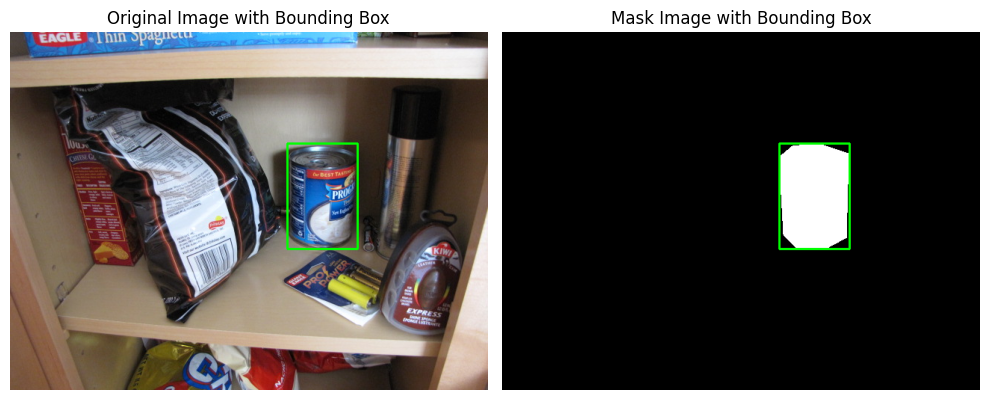

In [14]:
firstimgpath = 'data/CMU10_3D/data_2D/can_chowder_000001.jpg'
firstimgmaskpath = 'data/CMU10_3D/data_2D/can_chowder_000001_1_gt.png'
[xmin,xmax,ymin,ymax] = process_img_png_mask(firstimgpath, firstimgmaskpath, visualize = True)

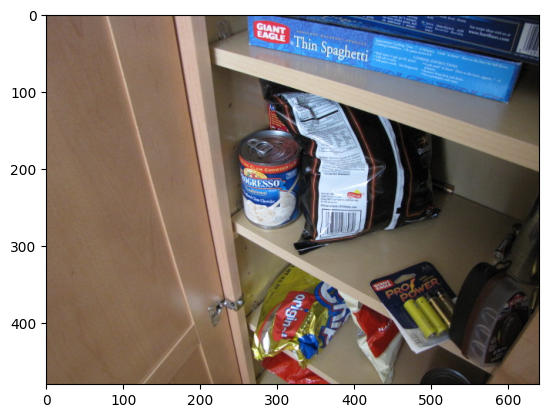

In [19]:
secondimgpath = 'data/CMU10_3D/data_2D/can_chowder_000002.jpg'
secondimg = Image.open(secondimgpath)
plt.imshow(secondimg)
plt.show()


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.49it/s]


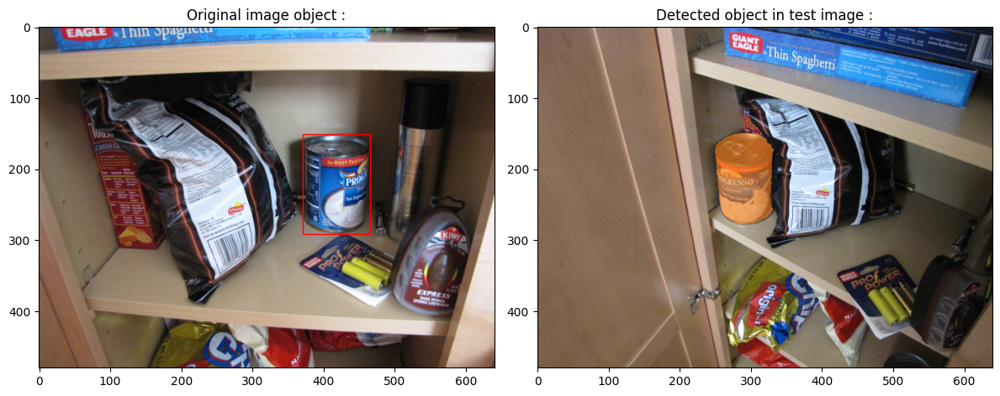

In [20]:
op = track_item_boxes(firstimgpath,secondimgpath,[([xmin,xmax,ymin,ymax],1)],visualize=True)

## Combine multiple mask images for single jpg image

### For some images, we have multiple mask images that need to be combined into a single mask image for inference.

In [58]:
# Define source and target directories
input_dir = 'data/CMU10_3D/data_2D/'
output_dir = 'data/CMU10_3D/combined_data/'

# Ensure output directory exists
os.makedirs(output_dir, exist_ok=True)

# Fetch all image files from the input directory
image_list = glob.glob(os.path.join(input_dir, '*.jpg'))

# Loop over each image in the directory
for img_path in image_list:
    # Extract the image filename without extension (e.g., 'can_soymilk_000012')
    img_name = os.path.splitext(os.path.basename(img_path))[0]

    # Locate all ground truth mask files associated with this image
    mask_list = glob.glob(os.path.join(input_dir, f'{img_name}_*_gt.png'))

    # If no masks are found, skip to the next image
    if not mask_list:
        print(f"No mask files found for {img_path}")
        continue

    # Handle the case where there's a single mask
    if len(mask_list) == 1:
        combined_mask = cv2.imread(mask_list[0], cv2.IMREAD_GRAYSCALE)
    else:
        # Combine multiple masks using bitwise OR operation
        combined_mask = np.zeros_like(cv2.imread(mask_list[0], cv2.IMREAD_GRAYSCALE))
        for mask_path in mask_list:
            current_mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
            combined_mask = cv2.bitwise_or(combined_mask, current_mask)

    # Save the processed mask and image to the output directory
    processed_mask_path = os.path.join(output_dir, f'{img_name}_1_gt.png')
    processed_img_path = os.path.join(output_dir, f'{img_name}.jpg')

    # Save the image and combined mask
    cv2.imwrite(processed_mask_path, combined_mask)
    cv2.imwrite(processed_img_path, cv2.imread(img_path))

    # Output processing information
    print(f"Processed {img_path} with {len(mask_list)} masks")

print("All images and masks have been processed successfully.")


Processed data/CMU10_3D/data_2D/carton_oj_000009.jpg with 2 masks
Processed data/CMU10_3D/data_2D/juicebox_000021.jpg with 1 masks
Processed data/CMU10_3D/data_2D/rice_tuscan_000004.jpg with 2 masks
Processed data/CMU10_3D/data_2D/hc_potroastsoup_000038.jpg with 1 masks
Processed data/CMU10_3D/data_2D/carton_oj_000036.jpg with 1 masks
Processed data/CMU10_3D/data_2D/can_chowder_000023.jpg with 2 masks
Processed data/CMU10_3D/data_2D/juicebox_000016.jpg with 2 masks
Processed data/CMU10_3D/data_2D/hc_potroastsoup_000017.jpg with 1 masks
Processed data/CMU10_3D/data_2D/rice_tuscan_000013.jpg with 1 masks
Processed data/CMU10_3D/data_2D/ricepilaf_000017.jpg with 1 masks
Processed data/CMU10_3D/data_2D/diet_coke_000044.jpg with 2 masks
Processed data/CMU10_3D/data_2D/can_tomatosoup_000037.jpg with 2 masks
Processed data/CMU10_3D/data_2D/rice_tuscan_000016.jpg with 1 masks
Processed data/CMU10_3D/data_2D/can_soymilk_000005.jpg with 1 masks
Processed data/CMU10_3D/data_2D/can_soymilk_000036.

# Visualization on a one image of each class

Directory 'data/CMU10_3D/grouped_data/' does not exist.
Files have been moved into class-based directories under data/CMU10_3D/grouped_data/
Processing class: can_chowder
Found image and mask for inference: data/CMU10_3D/grouped_data/can_chowder/can_chowder_000001.jpg, data/CMU10_3D/grouped_data/can_chowder/can_chowder_000001_1_gt.png
Bounding Box - x1, y1: (371, 150), x2, y2: (465, 291)


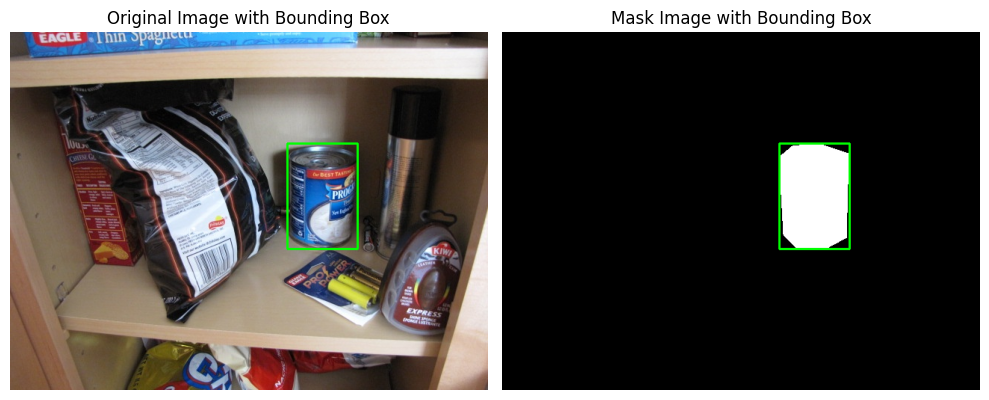

Running inference between data/CMU10_3D/grouped_data/can_chowder/can_chowder_000001.jpg and data/CMU10_3D/grouped_data/can_chowder/can_chowder_000002.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.39it/s]


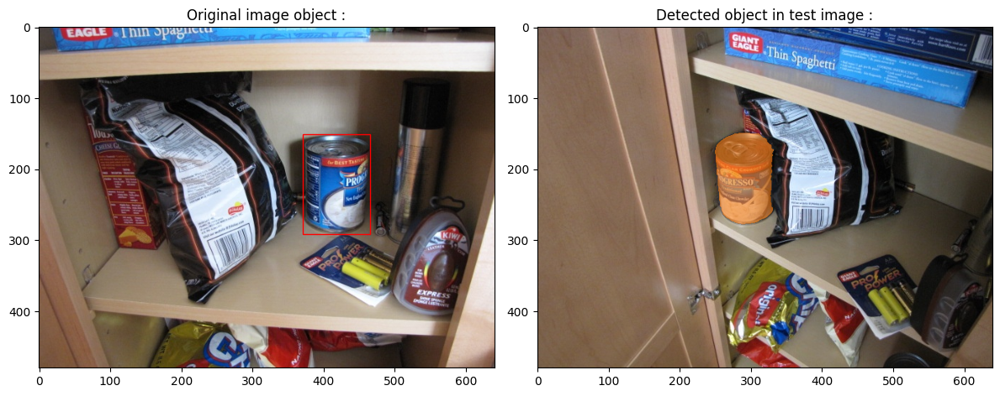

Mask generated for data/CMU10_3D/grouped_data/can_chowder/can_chowder_000002.jpg
Processing class: can_soymilk
Found image and mask for inference: data/CMU10_3D/grouped_data/can_soymilk/can_soymilk_000001.jpg, data/CMU10_3D/grouped_data/can_soymilk/can_soymilk_000001_1_gt.png
Bounding Box - x1, y1: (432, 101), x2, y2: (509, 230)


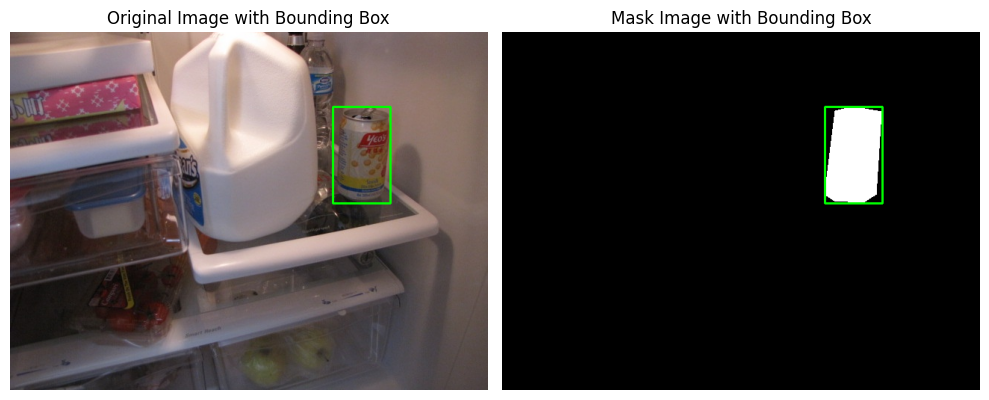

Running inference between data/CMU10_3D/grouped_data/can_soymilk/can_soymilk_000001.jpg and data/CMU10_3D/grouped_data/can_soymilk/can_soymilk_000002.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.07it/s]


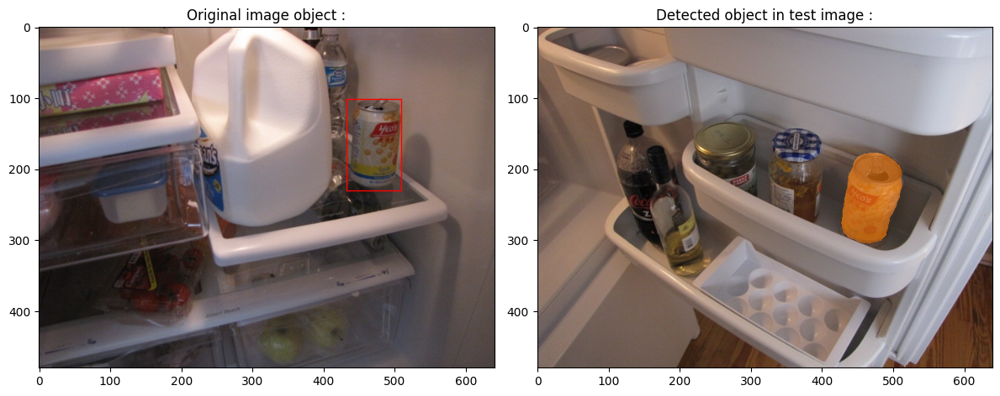

Mask generated for data/CMU10_3D/grouped_data/can_soymilk/can_soymilk_000002.jpg
Processing class: can_tomatosoup
Found image and mask for inference: data/CMU10_3D/grouped_data/can_tomatosoup/can_tomatosoup_000001.jpg, data/CMU10_3D/grouped_data/can_tomatosoup/can_tomatosoup_000001_1_gt.png
Bounding Box - x1, y1: (127, 135), x2, y2: (203, 240)


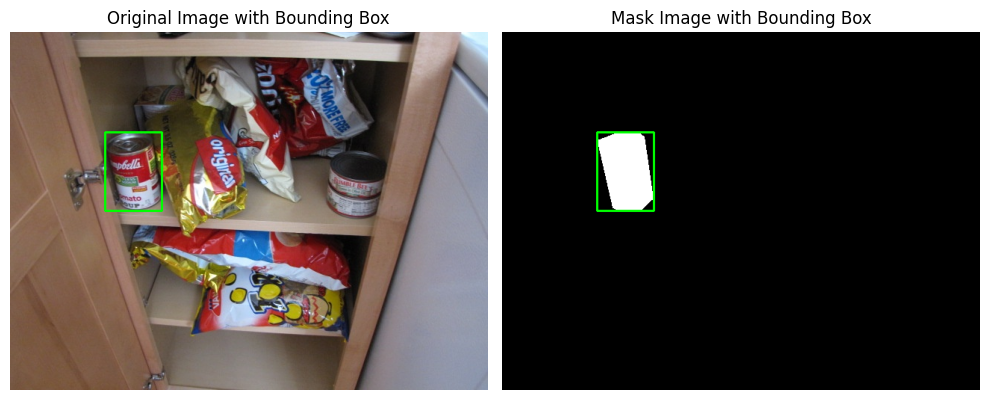

Running inference between data/CMU10_3D/grouped_data/can_tomatosoup/can_tomatosoup_000001.jpg and data/CMU10_3D/grouped_data/can_tomatosoup/can_tomatosoup_000002.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.33it/s]


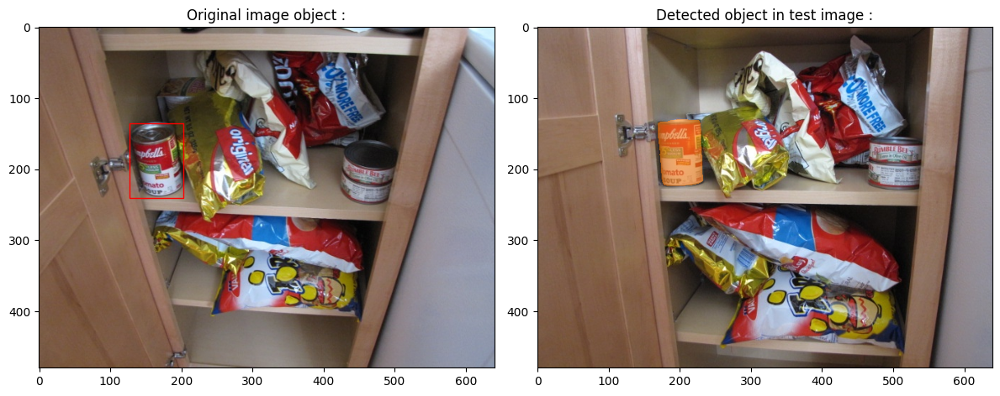

Mask generated for data/CMU10_3D/grouped_data/can_tomatosoup/can_tomatosoup_000002.jpg
Processing class: carton_oj
Found image and mask for inference: data/CMU10_3D/grouped_data/carton_oj/carton_oj_000001.jpg, data/CMU10_3D/grouped_data/carton_oj/carton_oj_000001_1_gt.png
Bounding Box - x1, y1: (118, 80), x2, y2: (226, 271)


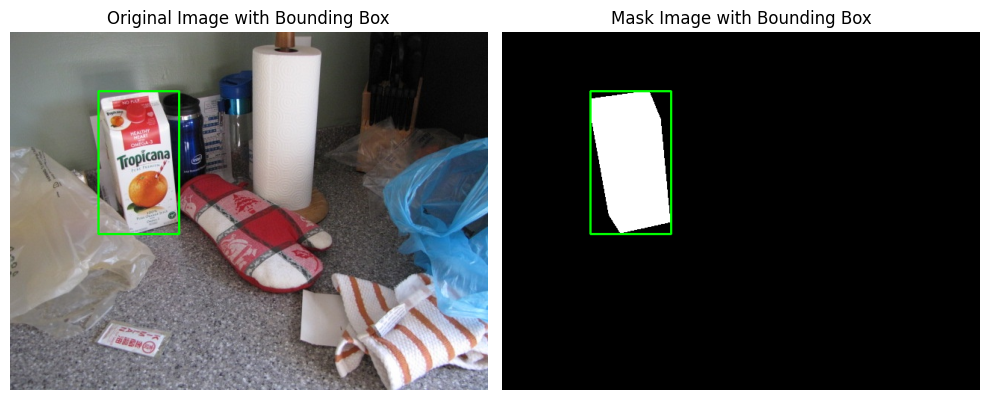

Running inference between data/CMU10_3D/grouped_data/carton_oj/carton_oj_000001.jpg and data/CMU10_3D/grouped_data/carton_oj/carton_oj_000002.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.09it/s]


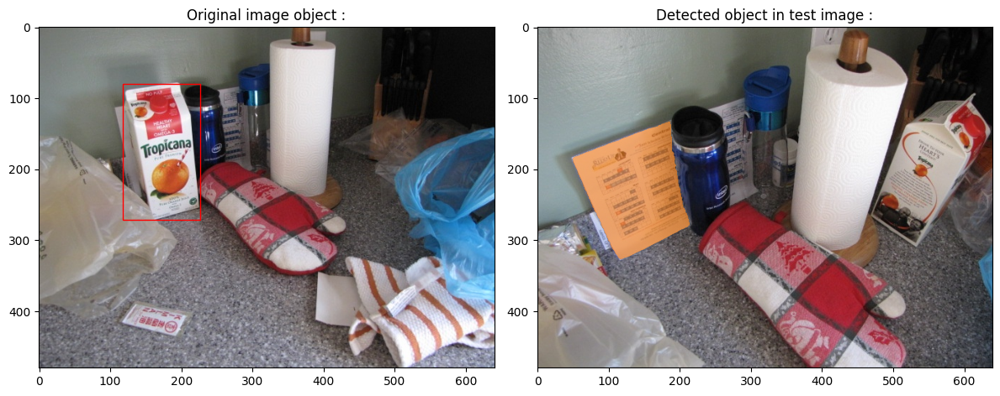

Mask generated for data/CMU10_3D/grouped_data/carton_oj/carton_oj_000002.jpg
Processing class: carton_soymilk
Found image and mask for inference: data/CMU10_3D/grouped_data/carton_soymilk/carton_soymilk_000001.jpg, data/CMU10_3D/grouped_data/carton_soymilk/carton_soymilk_000001_1_gt.png
Bounding Box - x1, y1: (355, 141), x2, y2: (440, 305)


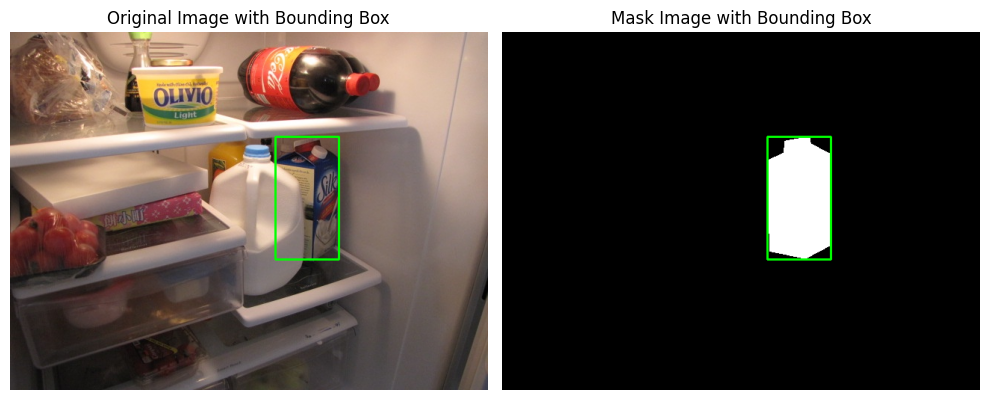

Running inference between data/CMU10_3D/grouped_data/carton_soymilk/carton_soymilk_000001.jpg and data/CMU10_3D/grouped_data/carton_soymilk/carton_soymilk_000002.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.98it/s]


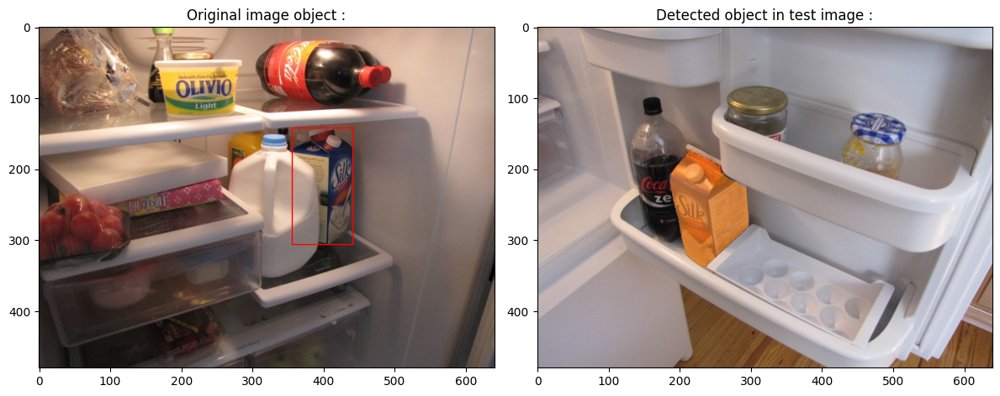

Mask generated for data/CMU10_3D/grouped_data/carton_soymilk/carton_soymilk_000002.jpg
Processing class: diet_coke
Found image and mask for inference: data/CMU10_3D/grouped_data/diet_coke/diet_coke_000001.jpg, data/CMU10_3D/grouped_data/diet_coke/diet_coke_000001_1_gt.png
Bounding Box - x1, y1: (354, 104), x2, y2: (446, 278)


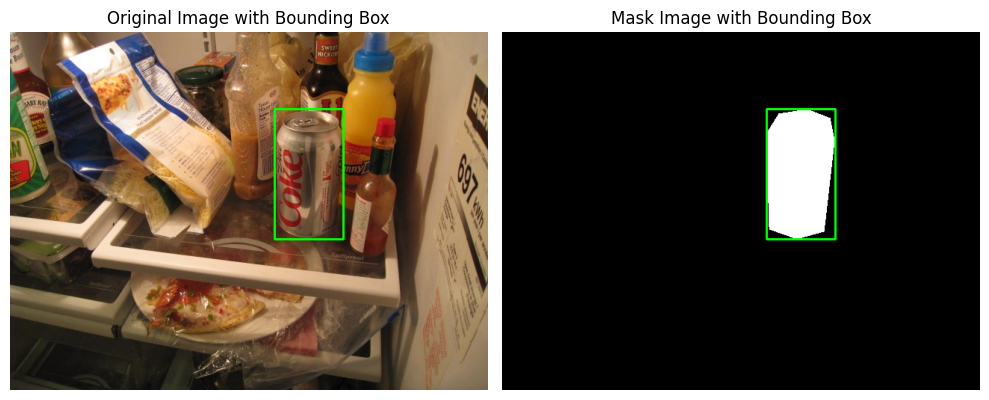

Running inference between data/CMU10_3D/grouped_data/diet_coke/diet_coke_000001.jpg and data/CMU10_3D/grouped_data/diet_coke/diet_coke_000002.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.86it/s]


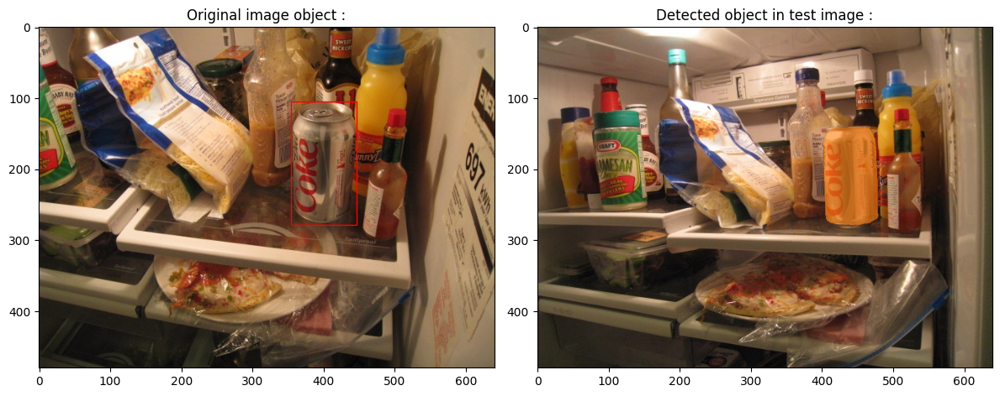

Mask generated for data/CMU10_3D/grouped_data/diet_coke/diet_coke_000002.jpg
Processing class: hc_potroastsoup
Found image and mask for inference: data/CMU10_3D/grouped_data/hc_potroastsoup/hc_potroastsoup_000001.jpg, data/CMU10_3D/grouped_data/hc_potroastsoup/hc_potroastsoup_000001_1_gt.png
Bounding Box - x1, y1: (147, 191), x2, y2: (289, 340)


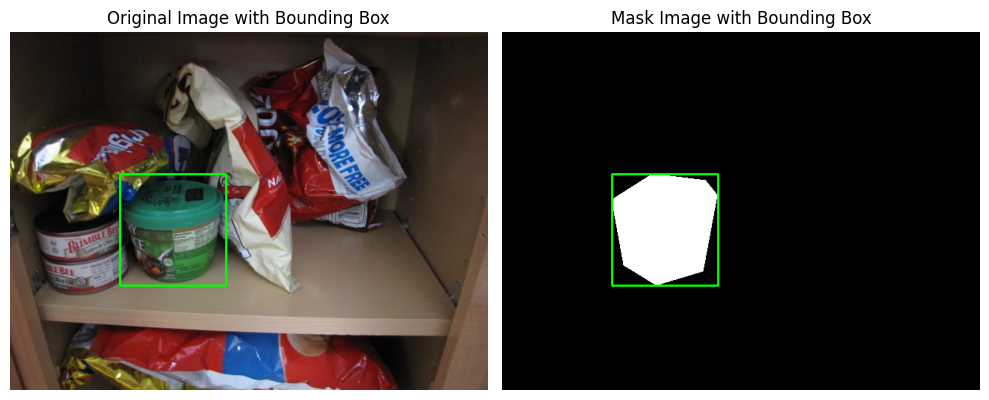

Running inference between data/CMU10_3D/grouped_data/hc_potroastsoup/hc_potroastsoup_000001.jpg and data/CMU10_3D/grouped_data/hc_potroastsoup/hc_potroastsoup_000002.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.98it/s]


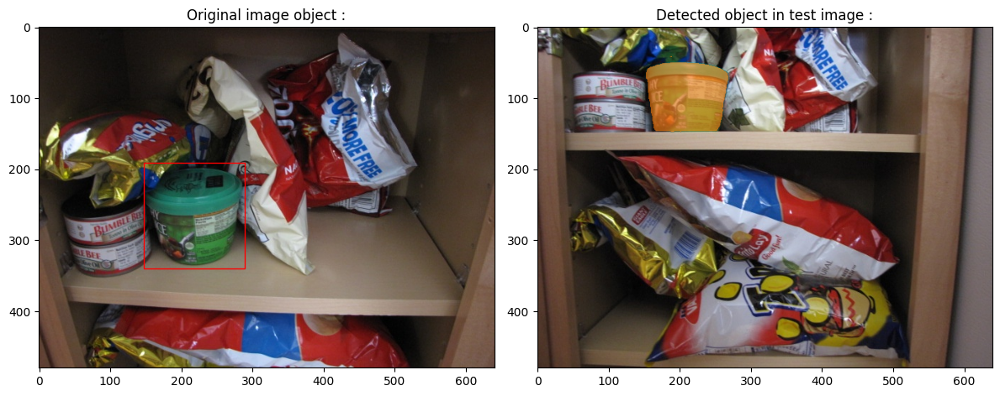

Mask generated for data/CMU10_3D/grouped_data/hc_potroastsoup/hc_potroastsoup_000002.jpg
Processing class: juicebox
Found image and mask for inference: data/CMU10_3D/grouped_data/juicebox/juicebox_000001.jpg, data/CMU10_3D/grouped_data/juicebox/juicebox_000001_1_gt.png
Bounding Box - x1, y1: (267, 208), x2, y2: (394, 333)


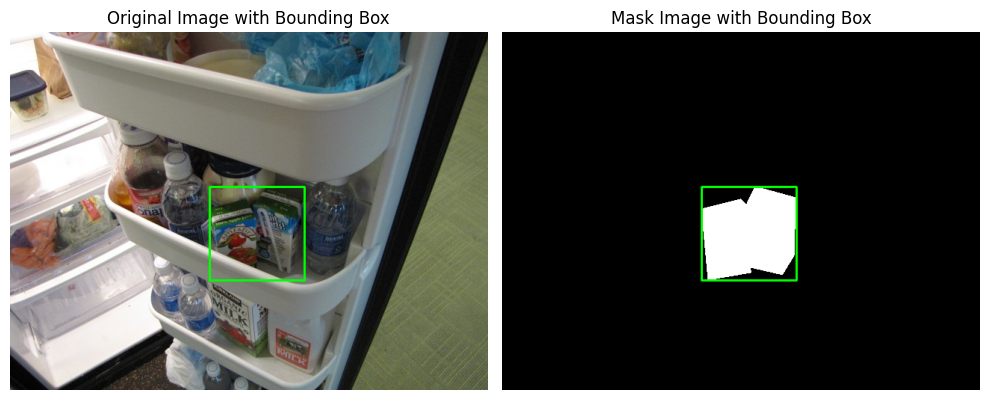

Running inference between data/CMU10_3D/grouped_data/juicebox/juicebox_000001.jpg and data/CMU10_3D/grouped_data/juicebox/juicebox_000002.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.96it/s]


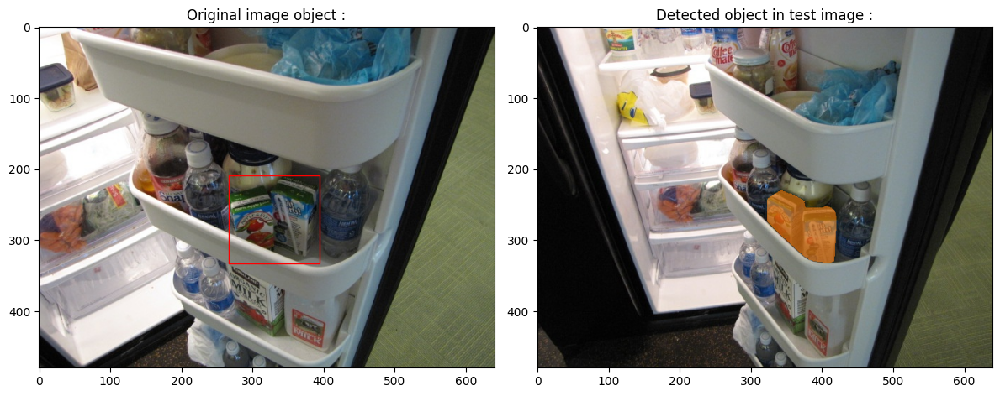

Mask generated for data/CMU10_3D/grouped_data/juicebox/juicebox_000002.jpg
Processing class: rice_tuscan
Found image and mask for inference: data/CMU10_3D/grouped_data/rice_tuscan/rice_tuscan_000001.jpg, data/CMU10_3D/grouped_data/rice_tuscan/rice_tuscan_000001_1_gt.png
Bounding Box - x1, y1: (217, 66), x2, y2: (308, 228)


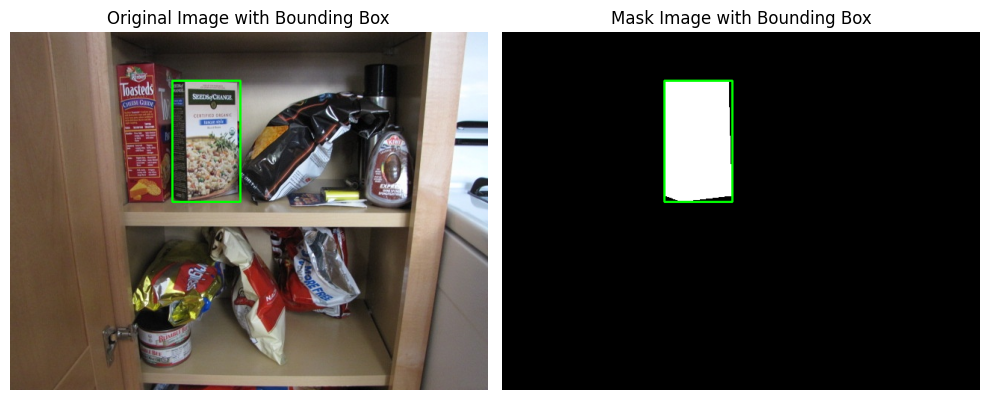

Running inference between data/CMU10_3D/grouped_data/rice_tuscan/rice_tuscan_000001.jpg and data/CMU10_3D/grouped_data/rice_tuscan/rice_tuscan_000002.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.11it/s]


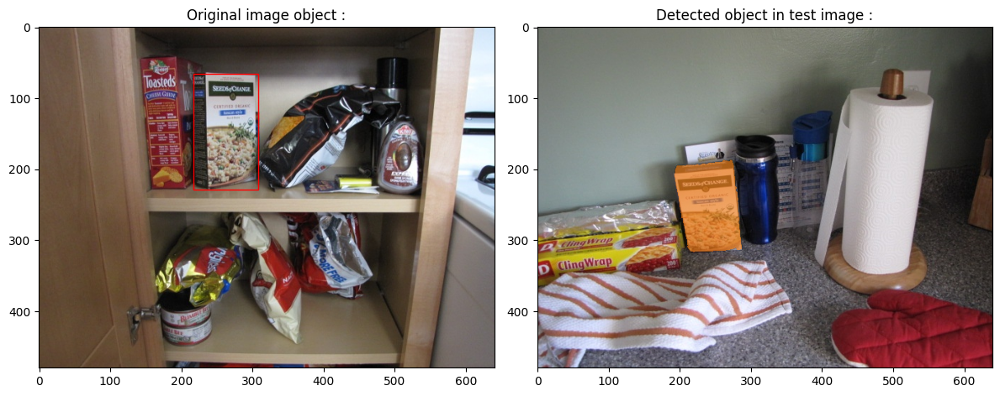

Mask generated for data/CMU10_3D/grouped_data/rice_tuscan/rice_tuscan_000002.jpg
Processing class: ricepilaf
Found image and mask for inference: data/CMU10_3D/grouped_data/ricepilaf/ricepilaf_000001.jpg, data/CMU10_3D/grouped_data/ricepilaf/ricepilaf_000001_1_gt.png
Bounding Box - x1, y1: (417, 104), x2, y2: (506, 243)


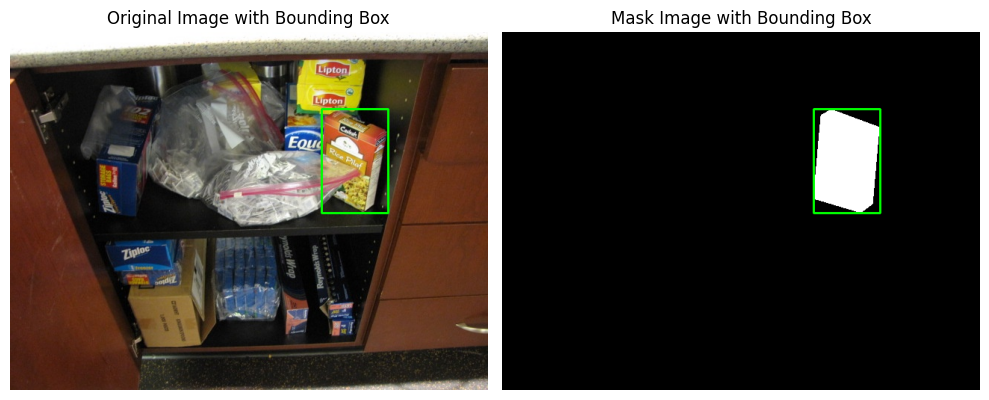

Running inference between data/CMU10_3D/grouped_data/ricepilaf/ricepilaf_000001.jpg and data/CMU10_3D/grouped_data/ricepilaf/ricepilaf_000002.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.99it/s]


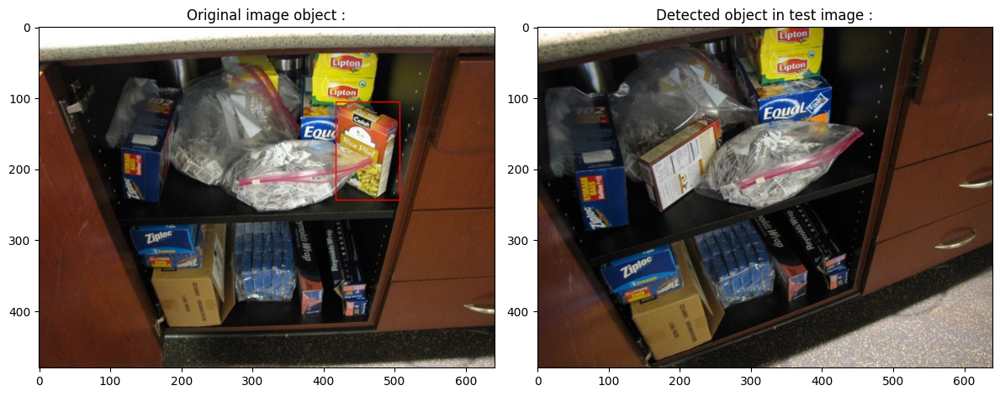

Mask generated for data/CMU10_3D/grouped_data/ricepilaf/ricepilaf_000002.jpg


In [25]:
def group_files_into_class_dirs(data_dir, output_dir):
    """
    Organizes files into separate directories based on product names.
    Each class gets its own directory, and the files are copied into these directories.
    Returns a dictionary mapping class names to their sorted file paths.
    """

    if os.path.exists(output_dir):
      shutil.rmtree(output_dir)
      print(f"Directory '{output_dir}' has been removed.")
    else:
      print(f"Directory '{output_dir}' does not exist.")

    # Ensure the output directory exists
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    class_dict = {}

    # Find all file paths in the given directory
    all_files = glob.glob(os.path.join(data_dir, '*'))

    # Process each file
    for file_path in sorted(all_files):
        # Extract the class name by splitting on '_0000'
        class_name = os.path.basename(file_path).split('_0000')[0]

        # Create a directory for the class if it doesn't exist
        class_dir = os.path.join(output_dir, class_name)
        if not os.path.exists(class_dir):
            os.makedirs(class_dir)

        # copy the file to the class directory
        shutil.copy(file_path, class_dir)

        # Append the file path to the class_dict
        if class_name not in class_dict:
            class_dict[class_name] = []
        class_dict[class_name].append(os.path.join(class_dir, os.path.basename(file_path)))

    print(f"Files have been moved into class-based directories under {output_dir}")
    return class_dict

def process_class_images(class_dict):
    """
    Processes images for each class, identifying the first image and its mask for inference.
    """
    for class_name, file_paths in class_dict.items():
        print(f"Processing class: {class_name}")

        # Sort file paths to ensure consistent processing order
        sorted_paths = sorted(file_paths)

        first_image = None
        first_mask = None

        # Identify the first image and corresponding mask for the class
        for file_path in sorted_paths:
            if file_path.endswith('.jpg') and not first_image:
                first_image = file_path

                # Construct the mask file name by replacing the suffix
                mask_file = first_image.replace('.jpg', '_1_gt.png')

                # Check if the corresponding mask exists
                if mask_file in sorted_paths:
                    first_mask = mask_file
                    break

        if first_image and first_mask:
            print(f"Found image and mask for inference: {first_image}, {first_mask}")
            run_inference_on_class(class_name, first_image, first_mask, sorted_paths)
        else:
            print(f"No matching image and mask found for class: {class_name}")

def run_inference_on_class(class_name, initial_image, initial_mask, sorted_paths):
    """
    Runs inference using the first image and mask, then processes second image only for each class.
    """
    inference_done = False

    # Process the first image and mask
    [xmin,xmax,ymin,ymax] = process_img_png_mask(initial_image, initial_mask)

    if not [xmin,xmax,ymin,ymax]:
        print(f"Failed to process {initial_image} and {initial_mask}")
        return

    for file_path in sorted_paths:
        # inference_done = False
        if file_path.endswith('.jpg') and file_path != initial_image and not inference_done:
            second_image = file_path
            print(f"Running inference between {initial_image} and {second_image}")

            # Perform tracking and segmentation
            video_segments = track_item_boxes(initial_image,second_image,[([xmin,xmax,ymin,ymax],1)],visualize=True)


            # Extract the output masks from the segmentation results
            output_masks = video_segments.get(1, {})
            relevant_mask = output_masks.get(1, None)

            if relevant_mask is not None:
                print(f"Mask generated for {second_image}")
            else:
                print(f"No mask generated for {second_image}")

            # Mark inference as done to prevent further processing for this class
            inference_done = True

    if not inference_done:
        print(f"No further images for inference in class {class_name}")

# Example usage
data_dir = 'data/CMU10_3D/combined_data/'  # Directory containing the original files
output_dir = 'data/CMU10_3D/grouped_data/'  # Directory where files will be grouped by class

# Step 1: Group files into class-based directories and return class_dict
class_dict = group_files_into_class_dirs(data_dir, output_dir)

# Step 2: Process images and run inference based on the grouped class directories
process_class_images(class_dict)


# Generate ground truth annotations
### This function is used to generate ground truth annotations which is required for coco evaluation.

In [59]:
def generate_ground_truth_annotations(mask_path, image_id, category_id=1):
    # Load the mask
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

    if mask is None:
        raise FileNotFoundError(f"Mask file {mask_path} not found or unable to load.")

    # Threshold the mask to ensure it's binary
    _, binary_mask = cv2.threshold(mask, 1, 255, cv2.THRESH_BINARY)

    # Find contours in the binary mask
    contours, _ = cv2.findContours(binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    if not contours:
        raise ValueError(f"No contours found in the mask {mask_path}.")

    # List to store bounding boxes
    coco_annotations = []

    # Iterate over contours and calculate bounding boxes
    for idx, contour in enumerate(contours):
        x, y, w, h = cv2.boundingRect(contour)
        #print(f"ground truth : {x, y, w, h}")
        coco_annotation = {
            "id": idx + 1,  # Ensure each annotation has a unique 'id'
            "image_id": image_id,
            "category_id": category_id,
            "bbox": [x, y, w, h],
            "area": w * h,
            "iscrowd": 0
        }
        coco_annotations.append(coco_annotation)

    return coco_annotations

#Example usage
#annotations = generate_ground_truth_annotations('data/CMU10_3D/processed_data/can_chowder_000005_1_gt.png', image_id=1, category_id=1)

# Optionally save to JSON file
# with open('annotations.json', 'w') as f:
#     json.dump(annotations, f, indent=4)


# Get file paths
### This function is used to retrieve all file paths to load the images for inference.

In [62]:
def get_file_paths(main_folder):
    folder_files_dict = {}

    # Iterate over each folder in the main folder
    for folder_name in os.listdir(main_folder):
        folder_path = os.path.join(main_folder, folder_name)

        # Check if it is a directory
        if os.path.isdir(folder_path):
            # List to store file paths
            file_paths = []

            # Iterate over each file in the folder
            for file_name in os.listdir(folder_path):
                file_path = os.path.join(folder_path, file_name)

                # Check if it is a file
                if os.path.isfile(file_path):
                    file_paths.append(file_path)

            # Add folder and file paths to the dictionary
            folder_files_dict[folder_name] = file_paths

    return folder_files_dict

# Example usage
main_folder = 'data/CMU10_3D/grouped_data'
product_dict = get_file_paths(main_folder)

In [63]:
product_category_id = {
    'can_chowder': 1,
    'can_soymilk': 2,
    'can_tomatosoup': 3,
    'carton_oj': 4,
    'carton_soymilk': 5,
    'diet_coke': 6,
    'hc_potroastsoup': 7,
    'juicebox': 8,
    'rice_tuscan': 9,
    'ricepilaf': 10
}

# Calculate IOU
### As the SAM2 model does not explicitly provide a confidence score for video inference, I am calculating the IoU and using it as the confidence score in the coco prediction format for coco evaluation.

In [64]:
def calculate_iou(box1, box2):
    # Calculate the intersection
    xA = max(box1[0], box2[0])
    yA = max(box1[1], box2[1])
    xB = min(box1[2], box2[2])
    yB = min(box1[3], box2[3])

    # Compute the area of intersection
    interArea = max(0, xB - xA + 1) * max(0, yB - yA + 1)

    # Compute the area of both the prediction and ground-truth rectangles
    box1Area = (box1[2] - box1[0] + 1) * (box1[3] - box1[1] + 1)
    box2Area = (box2[2] - box2[0] + 1) * (box2[3] - box2[1] + 1)

    # Compute the intersection over union
    iou = interArea / float(box1Area + box2Area - interArea)

    return iou

# Inference and Evaluation
### We need to ensure that the counts of coco_predictions and coco_annotations match for correct coco evaluation. However, for some images, a mask is not detected. To handle such cases, I have filtered coco_annotations based on coco_predictions, meaning the evaluation is only done on images where the model was able to make a prediction.

In [65]:
# loop for each image of each product
for class_name, file_paths in product_dict.items():
    print(f"Processing class: {class_name}")

    first_image_path = None
    first_mask_path = None

    category_id = product_category_id[class_name]

    # Sort the file paths to ensure they are in the correct order
    sorted_paths = sorted(file_paths)

    # Initialize lists to store ground truth and prediction data
    coco_annotations = []
    coco_predictions = []

    for path1 in sorted_paths:
      if path1.endswith('.jpg') and first_image_path is None:
        first_image_path = path1
        base_name = os.path.splitext(first_image_path)[0]
        corresponding_mask_path = base_name + '_1_gt.png'
        if corresponding_mask_path in sorted_paths:
            first_mask_path = corresponding_mask_path
            print(f"first_image_path : {first_image_path}")
            break

    img_id = 0
    valid_img_ids = []
    # Process each image for the current class
    for image_id, path in enumerate(sorted_paths, start=1):


        if path.endswith('.jpg'):
            base_name = os.path.splitext(path)[0]
            mask_path = base_name + '_1_gt.png'
            if os.path.exists(mask_path):
                #print(f"Processing image: {path} with mask: {mask_path}")

                # Generate ground truth annotations for the current image
                img_id = img_id + 1
                # print(f"image_id1 : {img_id}")
                ground_truth_annotations = generate_ground_truth_annotations(mask_path, image_id=img_id, category_id=category_id)
                coco_annotations.extend(ground_truth_annotations)

                # Perform inference
                # print(f"first_image_path : {first_image_path}")
                # print(f"first_mask_path : {first_mask_path}")
                print(f"path : {path}")
                [xmin, xmax, ymin, ymax] = process_img_png_mask(first_image_path, first_mask_path, visualize=False)
                video_segments = track_item_boxes(first_image_path, path, [([xmin, xmax, ymin, ymax], 1)], visualize=False)
                output_masks = video_segments.get(1, {})

                if not output_masks:
                    print(f"No relevant masks found for image {path}.")
                    continue

                relevant_mask = output_masks.get(1)
                if relevant_mask is None:
                    print(f"Relevant mask not found for image {path}.")
                    continue

                obj_ids = torch.unique(torch.from_numpy(relevant_mask))
                obj_ids = obj_ids[1:]
                relevant_mask = torch.from_numpy(relevant_mask)
                masks = relevant_mask == obj_ids[:, None, None]
                boxes = masks_to_boxes(masks)
                #print(boxes.shape)

                [g_xmin, g_xmax, g_ymin, g_ymax] = get_ground_truth_png_mask(mask_path, visualize=False)

                for box in boxes:
                    x_min, y_min, x_max, y_max = box[0].item(), box[1].item(), box[2].item(), box[3].item()


                    #print(f"Mask bounding box: {x_min, y_min, x_max, y_max}")
                    gt_box = [g_xmin, g_ymin, g_xmax, g_ymax]
                    #print(f"Ground truth: {gt_box}")

                    iou_score = calculate_iou([x_min, y_min, x_max, y_max], gt_box)
                    #print(f"IOU score: {iou_score}")


                    [x_min, y_min, width, height] = [x_min, y_min, x_max - x_min,  y_max - y_min ]

                    # print(f"image_id2 : {img_id}")
                    prediction = {
                        'id': len(coco_predictions) + 1,
                        'image_id': img_id,
                        'category_id': category_id,
                        'bbox': [x_min, y_min, width, height],
                        'score': iou_score
                    }
                    coco_predictions.append(prediction)
                    valid_img_ids.append(img_id)


    # After processing all images, filter the annotations and predictions
    filtered_annotations = [anno for anno in coco_annotations if anno['image_id'] in valid_img_ids]
    filtered_predictions = [pred for pred in coco_predictions if pred['image_id'] in valid_img_ids]

    # Initialize COCO ground truth and predictions
    coco_gt = COCO()
    coco_gt.dataset = {
        'annotations': filtered_annotations,
        'images': [{'id': i, 'file_name': f'image_{i}.jpg'} for i in range(1, len(sorted_paths) + 1)],
        'categories': [{'id': category_id, 'name': class_name}]
    }
    coco_gt.createIndex()

    try:
        coco_dt = coco_gt.loadRes(filtered_predictions)
    except Exception as e:
        print(f"Error loading predictions for class {class_name}: {e}")
        continue

    # COCOeval
    coco_eval = COCOeval(coco_gt, coco_dt, 'bbox')
    coco_eval.params.catIds = [category_id]
    coco_eval.params.imgIds = list(range(1, len(sorted_paths) + 1))

    # Run the evaluation
    coco_eval.evaluate()
    coco_eval.accumulate()
    print(f"Summary for class {class_name}:")
    coco_eval.summarize()

print("Inference and evaluation completed for all classes.")


Processing class: can_chowder
first_image_path : data/CMU10_3D/grouped_data/can_chowder/can_chowder_000001.jpg
path : data/CMU10_3D/grouped_data/can_chowder/can_chowder_000001.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  7.40it/s]


path : data/CMU10_3D/grouped_data/can_chowder/can_chowder_000002.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.27it/s]


path : data/CMU10_3D/grouped_data/can_chowder/can_chowder_000003.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.12it/s]


path : data/CMU10_3D/grouped_data/can_chowder/can_chowder_000004.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.98it/s]


path : data/CMU10_3D/grouped_data/can_chowder/can_chowder_000005.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.09it/s]


path : data/CMU10_3D/grouped_data/can_chowder/can_chowder_000006.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.05it/s]


path : data/CMU10_3D/grouped_data/can_chowder/can_chowder_000007.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.96it/s]


path : data/CMU10_3D/grouped_data/can_chowder/can_chowder_000008.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.05it/s]


path : data/CMU10_3D/grouped_data/can_chowder/can_chowder_000009.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.09it/s]


path : data/CMU10_3D/grouped_data/can_chowder/can_chowder_000010.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.13it/s]


path : data/CMU10_3D/grouped_data/can_chowder/can_chowder_000011.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.03it/s]


path : data/CMU10_3D/grouped_data/can_chowder/can_chowder_000012.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  7.78it/s]


path : data/CMU10_3D/grouped_data/can_chowder/can_chowder_000013.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.29it/s]


path : data/CMU10_3D/grouped_data/can_chowder/can_chowder_000014.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  8.21it/s]


path : data/CMU10_3D/grouped_data/can_chowder/can_chowder_000015.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  8.89it/s]


path : data/CMU10_3D/grouped_data/can_chowder/can_chowder_000016.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.00it/s]


path : data/CMU10_3D/grouped_data/can_chowder/can_chowder_000017.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.76it/s]


path : data/CMU10_3D/grouped_data/can_chowder/can_chowder_000018.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.03it/s]


path : data/CMU10_3D/grouped_data/can_chowder/can_chowder_000019.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.97it/s]


path : data/CMU10_3D/grouped_data/can_chowder/can_chowder_000020.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.62it/s]


path : data/CMU10_3D/grouped_data/can_chowder/can_chowder_000021.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.68it/s]


path : data/CMU10_3D/grouped_data/can_chowder/can_chowder_000022.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.82it/s]


path : data/CMU10_3D/grouped_data/can_chowder/can_chowder_000023.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  8.98it/s]


path : data/CMU10_3D/grouped_data/can_chowder/can_chowder_000024.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.72it/s]


path : data/CMU10_3D/grouped_data/can_chowder/can_chowder_000025.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.72it/s]


path : data/CMU10_3D/grouped_data/can_chowder/can_chowder_000026.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.52it/s]


path : data/CMU10_3D/grouped_data/can_chowder/can_chowder_000027.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.37it/s]


path : data/CMU10_3D/grouped_data/can_chowder/can_chowder_000028.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.12it/s]


path : data/CMU10_3D/grouped_data/can_chowder/can_chowder_000029.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.24it/s]


path : data/CMU10_3D/grouped_data/can_chowder/can_chowder_000030.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.64it/s]


path : data/CMU10_3D/grouped_data/can_chowder/can_chowder_000031.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.74it/s]


path : data/CMU10_3D/grouped_data/can_chowder/can_chowder_000032.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.49it/s]


path : data/CMU10_3D/grouped_data/can_chowder/can_chowder_000033.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.77it/s]


path : data/CMU10_3D/grouped_data/can_chowder/can_chowder_000034.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.72it/s]


path : data/CMU10_3D/grouped_data/can_chowder/can_chowder_000035.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.64it/s]


path : data/CMU10_3D/grouped_data/can_chowder/can_chowder_000036.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.82it/s]


path : data/CMU10_3D/grouped_data/can_chowder/can_chowder_000037.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.89it/s]


path : data/CMU10_3D/grouped_data/can_chowder/can_chowder_000038.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.90it/s]


path : data/CMU10_3D/grouped_data/can_chowder/can_chowder_000039.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.83it/s]


path : data/CMU10_3D/grouped_data/can_chowder/can_chowder_000040.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.95it/s]


path : data/CMU10_3D/grouped_data/can_chowder/can_chowder_000041.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.80it/s]


path : data/CMU10_3D/grouped_data/can_chowder/can_chowder_000042.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.82it/s]


path : data/CMU10_3D/grouped_data/can_chowder/can_chowder_000043.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.87it/s]


path : data/CMU10_3D/grouped_data/can_chowder/can_chowder_000044.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.90it/s]


path : data/CMU10_3D/grouped_data/can_chowder/can_chowder_000045.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.81it/s]


path : data/CMU10_3D/grouped_data/can_chowder/can_chowder_000046.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.84it/s]


path : data/CMU10_3D/grouped_data/can_chowder/can_chowder_000047.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.90it/s]


path : data/CMU10_3D/grouped_data/can_chowder/can_chowder_000048.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.81it/s]


path : data/CMU10_3D/grouped_data/can_chowder/can_chowder_000049.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.86it/s]


path : data/CMU10_3D/grouped_data/can_chowder/can_chowder_000050.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.06it/s]


creating index...
index created!
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.01s).
Accumulating evaluation results...
DONE (t=0.00s).
Summary for class can_chowder:
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.003
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.005
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.005
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.006
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.023
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.023
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.023
 Av

propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.01it/s]


path : data/CMU10_3D/grouped_data/can_soymilk/can_soymilk_000002.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.24it/s]


path : data/CMU10_3D/grouped_data/can_soymilk/can_soymilk_000003.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.10it/s]


path : data/CMU10_3D/grouped_data/can_soymilk/can_soymilk_000004.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.08it/s]


path : data/CMU10_3D/grouped_data/can_soymilk/can_soymilk_000005.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.93it/s]


path : data/CMU10_3D/grouped_data/can_soymilk/can_soymilk_000006.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.81it/s]


path : data/CMU10_3D/grouped_data/can_soymilk/can_soymilk_000007.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.74it/s]


path : data/CMU10_3D/grouped_data/can_soymilk/can_soymilk_000008.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.88it/s]


path : data/CMU10_3D/grouped_data/can_soymilk/can_soymilk_000009.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  8.28it/s]


path : data/CMU10_3D/grouped_data/can_soymilk/can_soymilk_000010.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.56it/s]


path : data/CMU10_3D/grouped_data/can_soymilk/can_soymilk_000011.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.22it/s]


path : data/CMU10_3D/grouped_data/can_soymilk/can_soymilk_000012.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.83it/s]


path : data/CMU10_3D/grouped_data/can_soymilk/can_soymilk_000013.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.94it/s]


path : data/CMU10_3D/grouped_data/can_soymilk/can_soymilk_000014.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.37it/s]


path : data/CMU10_3D/grouped_data/can_soymilk/can_soymilk_000015.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.02it/s]


path : data/CMU10_3D/grouped_data/can_soymilk/can_soymilk_000016.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.16it/s]


path : data/CMU10_3D/grouped_data/can_soymilk/can_soymilk_000017.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.86it/s]


path : data/CMU10_3D/grouped_data/can_soymilk/can_soymilk_000018.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.77it/s]


path : data/CMU10_3D/grouped_data/can_soymilk/can_soymilk_000019.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.09it/s]


path : data/CMU10_3D/grouped_data/can_soymilk/can_soymilk_000020.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.87it/s]


path : data/CMU10_3D/grouped_data/can_soymilk/can_soymilk_000021.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.90it/s]


path : data/CMU10_3D/grouped_data/can_soymilk/can_soymilk_000022.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.00it/s]


path : data/CMU10_3D/grouped_data/can_soymilk/can_soymilk_000023.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.10it/s]


path : data/CMU10_3D/grouped_data/can_soymilk/can_soymilk_000024.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.83it/s]


path : data/CMU10_3D/grouped_data/can_soymilk/can_soymilk_000025.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  8.96it/s]


path : data/CMU10_3D/grouped_data/can_soymilk/can_soymilk_000026.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.13it/s]


path : data/CMU10_3D/grouped_data/can_soymilk/can_soymilk_000027.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.24it/s]


path : data/CMU10_3D/grouped_data/can_soymilk/can_soymilk_000028.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.93it/s]


path : data/CMU10_3D/grouped_data/can_soymilk/can_soymilk_000029.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.06it/s]


path : data/CMU10_3D/grouped_data/can_soymilk/can_soymilk_000030.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.39it/s]


path : data/CMU10_3D/grouped_data/can_soymilk/can_soymilk_000031.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.46it/s]


path : data/CMU10_3D/grouped_data/can_soymilk/can_soymilk_000032.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.13it/s]


path : data/CMU10_3D/grouped_data/can_soymilk/can_soymilk_000033.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.36it/s]


path : data/CMU10_3D/grouped_data/can_soymilk/can_soymilk_000034.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.29it/s]


path : data/CMU10_3D/grouped_data/can_soymilk/can_soymilk_000035.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.24it/s]


path : data/CMU10_3D/grouped_data/can_soymilk/can_soymilk_000036.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.20it/s]


path : data/CMU10_3D/grouped_data/can_soymilk/can_soymilk_000037.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.15it/s]


path : data/CMU10_3D/grouped_data/can_soymilk/can_soymilk_000038.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.25it/s]


path : data/CMU10_3D/grouped_data/can_soymilk/can_soymilk_000039.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.15it/s]


path : data/CMU10_3D/grouped_data/can_soymilk/can_soymilk_000040.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.22it/s]


path : data/CMU10_3D/grouped_data/can_soymilk/can_soymilk_000041.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.72it/s]


path : data/CMU10_3D/grouped_data/can_soymilk/can_soymilk_000042.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.21it/s]


path : data/CMU10_3D/grouped_data/can_soymilk/can_soymilk_000043.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.34it/s]


path : data/CMU10_3D/grouped_data/can_soymilk/can_soymilk_000044.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.30it/s]


path : data/CMU10_3D/grouped_data/can_soymilk/can_soymilk_000045.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.23it/s]


path : data/CMU10_3D/grouped_data/can_soymilk/can_soymilk_000046.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.27it/s]


path : data/CMU10_3D/grouped_data/can_soymilk/can_soymilk_000047.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.15it/s]


path : data/CMU10_3D/grouped_data/can_soymilk/can_soymilk_000048.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.19it/s]


path : data/CMU10_3D/grouped_data/can_soymilk/can_soymilk_000049.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.45it/s]


path : data/CMU10_3D/grouped_data/can_soymilk/can_soymilk_000050.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.42it/s]


creating index...
index created!
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.01s).
Accumulating evaluation results...
DONE (t=0.01s).
Summary for class can_soymilk:
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.006
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.007
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.007
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.006
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.017
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.017
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.017
 A

propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.10it/s]


path : data/CMU10_3D/grouped_data/can_tomatosoup/can_tomatosoup_000002.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.11it/s]


path : data/CMU10_3D/grouped_data/can_tomatosoup/can_tomatosoup_000003.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.79it/s]


path : data/CMU10_3D/grouped_data/can_tomatosoup/can_tomatosoup_000004.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.22it/s]


path : data/CMU10_3D/grouped_data/can_tomatosoup/can_tomatosoup_000005.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.74it/s]


path : data/CMU10_3D/grouped_data/can_tomatosoup/can_tomatosoup_000006.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.21it/s]


path : data/CMU10_3D/grouped_data/can_tomatosoup/can_tomatosoup_000007.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.82it/s]


path : data/CMU10_3D/grouped_data/can_tomatosoup/can_tomatosoup_000008.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.25it/s]


path : data/CMU10_3D/grouped_data/can_tomatosoup/can_tomatosoup_000009.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.13it/s]


path : data/CMU10_3D/grouped_data/can_tomatosoup/can_tomatosoup_000010.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.17it/s]


path : data/CMU10_3D/grouped_data/can_tomatosoup/can_tomatosoup_000011.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.26it/s]


path : data/CMU10_3D/grouped_data/can_tomatosoup/can_tomatosoup_000012.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.27it/s]


path : data/CMU10_3D/grouped_data/can_tomatosoup/can_tomatosoup_000013.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.37it/s]


path : data/CMU10_3D/grouped_data/can_tomatosoup/can_tomatosoup_000014.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.26it/s]


path : data/CMU10_3D/grouped_data/can_tomatosoup/can_tomatosoup_000015.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.09it/s]


path : data/CMU10_3D/grouped_data/can_tomatosoup/can_tomatosoup_000016.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.29it/s]


path : data/CMU10_3D/grouped_data/can_tomatosoup/can_tomatosoup_000017.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.33it/s]


path : data/CMU10_3D/grouped_data/can_tomatosoup/can_tomatosoup_000018.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.21it/s]


path : data/CMU10_3D/grouped_data/can_tomatosoup/can_tomatosoup_000019.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.14it/s]


path : data/CMU10_3D/grouped_data/can_tomatosoup/can_tomatosoup_000020.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.19it/s]


path : data/CMU10_3D/grouped_data/can_tomatosoup/can_tomatosoup_000021.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.25it/s]


path : data/CMU10_3D/grouped_data/can_tomatosoup/can_tomatosoup_000022.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.29it/s]


path : data/CMU10_3D/grouped_data/can_tomatosoup/can_tomatosoup_000023.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.30it/s]


path : data/CMU10_3D/grouped_data/can_tomatosoup/can_tomatosoup_000024.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.07it/s]


path : data/CMU10_3D/grouped_data/can_tomatosoup/can_tomatosoup_000025.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.17it/s]


path : data/CMU10_3D/grouped_data/can_tomatosoup/can_tomatosoup_000026.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.25it/s]


path : data/CMU10_3D/grouped_data/can_tomatosoup/can_tomatosoup_000027.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.11it/s]


path : data/CMU10_3D/grouped_data/can_tomatosoup/can_tomatosoup_000028.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.40it/s]


path : data/CMU10_3D/grouped_data/can_tomatosoup/can_tomatosoup_000029.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.11it/s]


path : data/CMU10_3D/grouped_data/can_tomatosoup/can_tomatosoup_000030.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.09it/s]


path : data/CMU10_3D/grouped_data/can_tomatosoup/can_tomatosoup_000031.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.09it/s]


path : data/CMU10_3D/grouped_data/can_tomatosoup/can_tomatosoup_000032.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.80it/s]


path : data/CMU10_3D/grouped_data/can_tomatosoup/can_tomatosoup_000033.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.13it/s]


path : data/CMU10_3D/grouped_data/can_tomatosoup/can_tomatosoup_000034.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  7.64it/s]


path : data/CMU10_3D/grouped_data/can_tomatosoup/can_tomatosoup_000035.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.43it/s]


path : data/CMU10_3D/grouped_data/can_tomatosoup/can_tomatosoup_000036.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.36it/s]


path : data/CMU10_3D/grouped_data/can_tomatosoup/can_tomatosoup_000037.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  7.64it/s]


path : data/CMU10_3D/grouped_data/can_tomatosoup/can_tomatosoup_000038.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.31it/s]


path : data/CMU10_3D/grouped_data/can_tomatosoup/can_tomatosoup_000039.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.07it/s]


path : data/CMU10_3D/grouped_data/can_tomatosoup/can_tomatosoup_000040.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.33it/s]


path : data/CMU10_3D/grouped_data/can_tomatosoup/can_tomatosoup_000041.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.16it/s]


path : data/CMU10_3D/grouped_data/can_tomatosoup/can_tomatosoup_000042.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.11it/s]


path : data/CMU10_3D/grouped_data/can_tomatosoup/can_tomatosoup_000043.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.33it/s]


path : data/CMU10_3D/grouped_data/can_tomatosoup/can_tomatosoup_000044.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.25it/s]


path : data/CMU10_3D/grouped_data/can_tomatosoup/can_tomatosoup_000045.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.30it/s]


path : data/CMU10_3D/grouped_data/can_tomatosoup/can_tomatosoup_000046.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.29it/s]


path : data/CMU10_3D/grouped_data/can_tomatosoup/can_tomatosoup_000047.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.97it/s]


path : data/CMU10_3D/grouped_data/can_tomatosoup/can_tomatosoup_000048.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.23it/s]


path : data/CMU10_3D/grouped_data/can_tomatosoup/can_tomatosoup_000049.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.04it/s]


path : data/CMU10_3D/grouped_data/can_tomatosoup/can_tomatosoup_000050.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.18it/s]


creating index...
index created!
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.01s).
Accumulating evaluation results...
DONE (t=0.00s).
Summary for class can_tomatosoup:
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.013
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.015
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.015
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.027
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.047
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.047
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.047

propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.07it/s]


path : data/CMU10_3D/grouped_data/carton_oj/carton_oj_000002.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.96it/s]


path : data/CMU10_3D/grouped_data/carton_oj/carton_oj_000003.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.14it/s]


path : data/CMU10_3D/grouped_data/carton_oj/carton_oj_000004.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.23it/s]


path : data/CMU10_3D/grouped_data/carton_oj/carton_oj_000005.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.05it/s]


path : data/CMU10_3D/grouped_data/carton_oj/carton_oj_000006.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.07it/s]


path : data/CMU10_3D/grouped_data/carton_oj/carton_oj_000007.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.14it/s]


path : data/CMU10_3D/grouped_data/carton_oj/carton_oj_000008.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.31it/s]


path : data/CMU10_3D/grouped_data/carton_oj/carton_oj_000009.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.89it/s]


path : data/CMU10_3D/grouped_data/carton_oj/carton_oj_000010.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.26it/s]


path : data/CMU10_3D/grouped_data/carton_oj/carton_oj_000011.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.12it/s]


path : data/CMU10_3D/grouped_data/carton_oj/carton_oj_000012.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.03it/s]


path : data/CMU10_3D/grouped_data/carton_oj/carton_oj_000013.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.97it/s]


path : data/CMU10_3D/grouped_data/carton_oj/carton_oj_000014.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.07it/s]


path : data/CMU10_3D/grouped_data/carton_oj/carton_oj_000015.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.99it/s]


path : data/CMU10_3D/grouped_data/carton_oj/carton_oj_000016.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.20it/s]


path : data/CMU10_3D/grouped_data/carton_oj/carton_oj_000017.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.09it/s]


path : data/CMU10_3D/grouped_data/carton_oj/carton_oj_000018.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.72it/s]


path : data/CMU10_3D/grouped_data/carton_oj/carton_oj_000019.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.55it/s]


path : data/CMU10_3D/grouped_data/carton_oj/carton_oj_000020.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.16it/s]


path : data/CMU10_3D/grouped_data/carton_oj/carton_oj_000021.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.13it/s]


path : data/CMU10_3D/grouped_data/carton_oj/carton_oj_000022.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.15it/s]


path : data/CMU10_3D/grouped_data/carton_oj/carton_oj_000023.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  8.91it/s]


path : data/CMU10_3D/grouped_data/carton_oj/carton_oj_000024.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.62it/s]


path : data/CMU10_3D/grouped_data/carton_oj/carton_oj_000025.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.97it/s]


path : data/CMU10_3D/grouped_data/carton_oj/carton_oj_000026.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.99it/s]


path : data/CMU10_3D/grouped_data/carton_oj/carton_oj_000027.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.66it/s]


path : data/CMU10_3D/grouped_data/carton_oj/carton_oj_000028.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.01it/s]


path : data/CMU10_3D/grouped_data/carton_oj/carton_oj_000029.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.27it/s]


path : data/CMU10_3D/grouped_data/carton_oj/carton_oj_000030.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.99it/s]


path : data/CMU10_3D/grouped_data/carton_oj/carton_oj_000031.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  8.99it/s]


path : data/CMU10_3D/grouped_data/carton_oj/carton_oj_000032.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  8.83it/s]


path : data/CMU10_3D/grouped_data/carton_oj/carton_oj_000033.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.61it/s]


path : data/CMU10_3D/grouped_data/carton_oj/carton_oj_000034.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.33it/s]


path : data/CMU10_3D/grouped_data/carton_oj/carton_oj_000035.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.41it/s]


path : data/CMU10_3D/grouped_data/carton_oj/carton_oj_000036.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.87it/s]


path : data/CMU10_3D/grouped_data/carton_oj/carton_oj_000037.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.56it/s]


path : data/CMU10_3D/grouped_data/carton_oj/carton_oj_000038.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.97it/s]


path : data/CMU10_3D/grouped_data/carton_oj/carton_oj_000039.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.60it/s]


path : data/CMU10_3D/grouped_data/carton_oj/carton_oj_000040.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.73it/s]


path : data/CMU10_3D/grouped_data/carton_oj/carton_oj_000041.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.35it/s]


path : data/CMU10_3D/grouped_data/carton_oj/carton_oj_000042.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.06it/s]


path : data/CMU10_3D/grouped_data/carton_oj/carton_oj_000043.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.05it/s]


path : data/CMU10_3D/grouped_data/carton_oj/carton_oj_000044.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.10it/s]


path : data/CMU10_3D/grouped_data/carton_oj/carton_oj_000045.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.24it/s]


path : data/CMU10_3D/grouped_data/carton_oj/carton_oj_000046.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.07it/s]


path : data/CMU10_3D/grouped_data/carton_oj/carton_oj_000047.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.87it/s]


path : data/CMU10_3D/grouped_data/carton_oj/carton_oj_000048.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.14it/s]


path : data/CMU10_3D/grouped_data/carton_oj/carton_oj_000049.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.05it/s]


path : data/CMU10_3D/grouped_data/carton_oj/carton_oj_000050.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.93it/s]


creating index...
index created!
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.01s).
Accumulating evaluation results...
DONE (t=0.01s).
Summary for class carton_oj:
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
 Ave

propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.87it/s]


path : data/CMU10_3D/grouped_data/carton_soymilk/carton_soymilk_000002.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.19it/s]


path : data/CMU10_3D/grouped_data/carton_soymilk/carton_soymilk_000003.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.29it/s]


path : data/CMU10_3D/grouped_data/carton_soymilk/carton_soymilk_000004.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.51it/s]


path : data/CMU10_3D/grouped_data/carton_soymilk/carton_soymilk_000005.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.89it/s]


path : data/CMU10_3D/grouped_data/carton_soymilk/carton_soymilk_000006.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.90it/s]


path : data/CMU10_3D/grouped_data/carton_soymilk/carton_soymilk_000007.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.02it/s]


path : data/CMU10_3D/grouped_data/carton_soymilk/carton_soymilk_000008.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.72it/s]


path : data/CMU10_3D/grouped_data/carton_soymilk/carton_soymilk_000009.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.02it/s]


path : data/CMU10_3D/grouped_data/carton_soymilk/carton_soymilk_000010.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.85it/s]


path : data/CMU10_3D/grouped_data/carton_soymilk/carton_soymilk_000011.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.33it/s]


path : data/CMU10_3D/grouped_data/carton_soymilk/carton_soymilk_000012.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.11it/s]


path : data/CMU10_3D/grouped_data/carton_soymilk/carton_soymilk_000013.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.48it/s]


path : data/CMU10_3D/grouped_data/carton_soymilk/carton_soymilk_000014.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.12it/s]


path : data/CMU10_3D/grouped_data/carton_soymilk/carton_soymilk_000015.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.93it/s]


path : data/CMU10_3D/grouped_data/carton_soymilk/carton_soymilk_000016.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.81it/s]


path : data/CMU10_3D/grouped_data/carton_soymilk/carton_soymilk_000017.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.75it/s]


path : data/CMU10_3D/grouped_data/carton_soymilk/carton_soymilk_000018.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.04it/s]


path : data/CMU10_3D/grouped_data/carton_soymilk/carton_soymilk_000019.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.96it/s]


path : data/CMU10_3D/grouped_data/carton_soymilk/carton_soymilk_000020.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.02it/s]


path : data/CMU10_3D/grouped_data/carton_soymilk/carton_soymilk_000021.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.08it/s]


path : data/CMU10_3D/grouped_data/carton_soymilk/carton_soymilk_000022.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.27it/s]


path : data/CMU10_3D/grouped_data/carton_soymilk/carton_soymilk_000023.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.12it/s]


path : data/CMU10_3D/grouped_data/carton_soymilk/carton_soymilk_000024.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.10it/s]


path : data/CMU10_3D/grouped_data/carton_soymilk/carton_soymilk_000025.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.03it/s]


path : data/CMU10_3D/grouped_data/carton_soymilk/carton_soymilk_000026.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.13it/s]


path : data/CMU10_3D/grouped_data/carton_soymilk/carton_soymilk_000027.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.15it/s]


path : data/CMU10_3D/grouped_data/carton_soymilk/carton_soymilk_000028.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.10it/s]


path : data/CMU10_3D/grouped_data/carton_soymilk/carton_soymilk_000029.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.32it/s]


path : data/CMU10_3D/grouped_data/carton_soymilk/carton_soymilk_000030.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.20it/s]


path : data/CMU10_3D/grouped_data/carton_soymilk/carton_soymilk_000031.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.27it/s]


path : data/CMU10_3D/grouped_data/carton_soymilk/carton_soymilk_000032.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.07it/s]


path : data/CMU10_3D/grouped_data/carton_soymilk/carton_soymilk_000033.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.98it/s]


path : data/CMU10_3D/grouped_data/carton_soymilk/carton_soymilk_000034.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.08it/s]


path : data/CMU10_3D/grouped_data/carton_soymilk/carton_soymilk_000035.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.73it/s]


path : data/CMU10_3D/grouped_data/carton_soymilk/carton_soymilk_000036.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  8.86it/s]


path : data/CMU10_3D/grouped_data/carton_soymilk/carton_soymilk_000037.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.37it/s]


path : data/CMU10_3D/grouped_data/carton_soymilk/carton_soymilk_000038.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  8.95it/s]


path : data/CMU10_3D/grouped_data/carton_soymilk/carton_soymilk_000039.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  8.71it/s]


path : data/CMU10_3D/grouped_data/carton_soymilk/carton_soymilk_000040.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.22it/s]


path : data/CMU10_3D/grouped_data/carton_soymilk/carton_soymilk_000041.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.08it/s]


path : data/CMU10_3D/grouped_data/carton_soymilk/carton_soymilk_000042.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.15it/s]


path : data/CMU10_3D/grouped_data/carton_soymilk/carton_soymilk_000043.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.71it/s]


path : data/CMU10_3D/grouped_data/carton_soymilk/carton_soymilk_000044.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.06it/s]


path : data/CMU10_3D/grouped_data/carton_soymilk/carton_soymilk_000045.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.23it/s]


path : data/CMU10_3D/grouped_data/carton_soymilk/carton_soymilk_000046.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.24it/s]


path : data/CMU10_3D/grouped_data/carton_soymilk/carton_soymilk_000047.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.49it/s]


path : data/CMU10_3D/grouped_data/carton_soymilk/carton_soymilk_000048.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.27it/s]


path : data/CMU10_3D/grouped_data/carton_soymilk/carton_soymilk_000049.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.17it/s]


path : data/CMU10_3D/grouped_data/carton_soymilk/carton_soymilk_000050.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.06it/s]


creating index...
index created!
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.01s).
Accumulating evaluation results...
DONE (t=0.01s).
Summary for class carton_soymilk:
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.007
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.007
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.007

propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.11it/s]


path : data/CMU10_3D/grouped_data/diet_coke/diet_coke_000002.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.11it/s]


path : data/CMU10_3D/grouped_data/diet_coke/diet_coke_000003.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.21it/s]


path : data/CMU10_3D/grouped_data/diet_coke/diet_coke_000004.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.30it/s]


path : data/CMU10_3D/grouped_data/diet_coke/diet_coke_000005.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.41it/s]


path : data/CMU10_3D/grouped_data/diet_coke/diet_coke_000006.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.08it/s]


path : data/CMU10_3D/grouped_data/diet_coke/diet_coke_000007.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.00it/s]


path : data/CMU10_3D/grouped_data/diet_coke/diet_coke_000008.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.14it/s]


path : data/CMU10_3D/grouped_data/diet_coke/diet_coke_000009.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.18it/s]


path : data/CMU10_3D/grouped_data/diet_coke/diet_coke_000010.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.13it/s]


path : data/CMU10_3D/grouped_data/diet_coke/diet_coke_000011.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.02it/s]


path : data/CMU10_3D/grouped_data/diet_coke/diet_coke_000012.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.01it/s]


path : data/CMU10_3D/grouped_data/diet_coke/diet_coke_000013.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.18it/s]


path : data/CMU10_3D/grouped_data/diet_coke/diet_coke_000014.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.06it/s]


path : data/CMU10_3D/grouped_data/diet_coke/diet_coke_000015.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.15it/s]


path : data/CMU10_3D/grouped_data/diet_coke/diet_coke_000016.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.26it/s]


path : data/CMU10_3D/grouped_data/diet_coke/diet_coke_000017.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.21it/s]


path : data/CMU10_3D/grouped_data/diet_coke/diet_coke_000018.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.18it/s]


path : data/CMU10_3D/grouped_data/diet_coke/diet_coke_000019.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.13it/s]


path : data/CMU10_3D/grouped_data/diet_coke/diet_coke_000020.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.07it/s]


path : data/CMU10_3D/grouped_data/diet_coke/diet_coke_000021.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.06it/s]


path : data/CMU10_3D/grouped_data/diet_coke/diet_coke_000022.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.12it/s]


path : data/CMU10_3D/grouped_data/diet_coke/diet_coke_000023.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.09it/s]


path : data/CMU10_3D/grouped_data/diet_coke/diet_coke_000024.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.12it/s]


path : data/CMU10_3D/grouped_data/diet_coke/diet_coke_000025.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.95it/s]


path : data/CMU10_3D/grouped_data/diet_coke/diet_coke_000026.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.19it/s]


path : data/CMU10_3D/grouped_data/diet_coke/diet_coke_000027.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.08it/s]


path : data/CMU10_3D/grouped_data/diet_coke/diet_coke_000028.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.29it/s]


path : data/CMU10_3D/grouped_data/diet_coke/diet_coke_000029.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.77it/s]


path : data/CMU10_3D/grouped_data/diet_coke/diet_coke_000030.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.73it/s]


path : data/CMU10_3D/grouped_data/diet_coke/diet_coke_000031.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.29it/s]


path : data/CMU10_3D/grouped_data/diet_coke/diet_coke_000032.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.92it/s]


path : data/CMU10_3D/grouped_data/diet_coke/diet_coke_000033.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.21it/s]


path : data/CMU10_3D/grouped_data/diet_coke/diet_coke_000034.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.16it/s]


path : data/CMU10_3D/grouped_data/diet_coke/diet_coke_000035.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.00it/s]


path : data/CMU10_3D/grouped_data/diet_coke/diet_coke_000036.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.06it/s]


path : data/CMU10_3D/grouped_data/diet_coke/diet_coke_000037.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.29it/s]


path : data/CMU10_3D/grouped_data/diet_coke/diet_coke_000038.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.17it/s]


path : data/CMU10_3D/grouped_data/diet_coke/diet_coke_000039.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.18it/s]


path : data/CMU10_3D/grouped_data/diet_coke/diet_coke_000040.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.99it/s]


path : data/CMU10_3D/grouped_data/diet_coke/diet_coke_000041.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.29it/s]


path : data/CMU10_3D/grouped_data/diet_coke/diet_coke_000042.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.11it/s]


path : data/CMU10_3D/grouped_data/diet_coke/diet_coke_000043.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.17it/s]


path : data/CMU10_3D/grouped_data/diet_coke/diet_coke_000044.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.11it/s]


path : data/CMU10_3D/grouped_data/diet_coke/diet_coke_000045.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.23it/s]


path : data/CMU10_3D/grouped_data/diet_coke/diet_coke_000046.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.26it/s]


path : data/CMU10_3D/grouped_data/diet_coke/diet_coke_000047.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.22it/s]


path : data/CMU10_3D/grouped_data/diet_coke/diet_coke_000048.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.11it/s]


path : data/CMU10_3D/grouped_data/diet_coke/diet_coke_000049.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.36it/s]


path : data/CMU10_3D/grouped_data/diet_coke/diet_coke_000050.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.36it/s]


creating index...
index created!
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.01s).
Accumulating evaluation results...
DONE (t=0.00s).
Summary for class diet_coke:
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.002
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.003
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.003
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.002
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.014
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.014
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.014
 Ave

propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.06it/s]


path : data/CMU10_3D/grouped_data/hc_potroastsoup/hc_potroastsoup_000002.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.25it/s]


path : data/CMU10_3D/grouped_data/hc_potroastsoup/hc_potroastsoup_000003.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.35it/s]


path : data/CMU10_3D/grouped_data/hc_potroastsoup/hc_potroastsoup_000004.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.31it/s]


path : data/CMU10_3D/grouped_data/hc_potroastsoup/hc_potroastsoup_000005.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.27it/s]


path : data/CMU10_3D/grouped_data/hc_potroastsoup/hc_potroastsoup_000006.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.14it/s]


path : data/CMU10_3D/grouped_data/hc_potroastsoup/hc_potroastsoup_000007.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.26it/s]


path : data/CMU10_3D/grouped_data/hc_potroastsoup/hc_potroastsoup_000008.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.19it/s]


path : data/CMU10_3D/grouped_data/hc_potroastsoup/hc_potroastsoup_000009.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.22it/s]


path : data/CMU10_3D/grouped_data/hc_potroastsoup/hc_potroastsoup_000010.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.92it/s]


path : data/CMU10_3D/grouped_data/hc_potroastsoup/hc_potroastsoup_000011.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.89it/s]


path : data/CMU10_3D/grouped_data/hc_potroastsoup/hc_potroastsoup_000012.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.81it/s]


path : data/CMU10_3D/grouped_data/hc_potroastsoup/hc_potroastsoup_000013.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.25it/s]


path : data/CMU10_3D/grouped_data/hc_potroastsoup/hc_potroastsoup_000014.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.06it/s]


path : data/CMU10_3D/grouped_data/hc_potroastsoup/hc_potroastsoup_000015.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.17it/s]


path : data/CMU10_3D/grouped_data/hc_potroastsoup/hc_potroastsoup_000016.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.98it/s]


path : data/CMU10_3D/grouped_data/hc_potroastsoup/hc_potroastsoup_000017.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.29it/s]


path : data/CMU10_3D/grouped_data/hc_potroastsoup/hc_potroastsoup_000018.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.22it/s]


path : data/CMU10_3D/grouped_data/hc_potroastsoup/hc_potroastsoup_000019.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.42it/s]


path : data/CMU10_3D/grouped_data/hc_potroastsoup/hc_potroastsoup_000020.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.53it/s]


path : data/CMU10_3D/grouped_data/hc_potroastsoup/hc_potroastsoup_000021.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.01it/s]


path : data/CMU10_3D/grouped_data/hc_potroastsoup/hc_potroastsoup_000022.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.43it/s]


path : data/CMU10_3D/grouped_data/hc_potroastsoup/hc_potroastsoup_000023.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.35it/s]


path : data/CMU10_3D/grouped_data/hc_potroastsoup/hc_potroastsoup_000024.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.34it/s]


path : data/CMU10_3D/grouped_data/hc_potroastsoup/hc_potroastsoup_000025.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.42it/s]


path : data/CMU10_3D/grouped_data/hc_potroastsoup/hc_potroastsoup_000026.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.25it/s]


path : data/CMU10_3D/grouped_data/hc_potroastsoup/hc_potroastsoup_000027.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.35it/s]


path : data/CMU10_3D/grouped_data/hc_potroastsoup/hc_potroastsoup_000028.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.29it/s]


path : data/CMU10_3D/grouped_data/hc_potroastsoup/hc_potroastsoup_000029.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.17it/s]


path : data/CMU10_3D/grouped_data/hc_potroastsoup/hc_potroastsoup_000030.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.21it/s]


path : data/CMU10_3D/grouped_data/hc_potroastsoup/hc_potroastsoup_000031.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.17it/s]


path : data/CMU10_3D/grouped_data/hc_potroastsoup/hc_potroastsoup_000032.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.20it/s]


path : data/CMU10_3D/grouped_data/hc_potroastsoup/hc_potroastsoup_000033.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.33it/s]


path : data/CMU10_3D/grouped_data/hc_potroastsoup/hc_potroastsoup_000034.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.23it/s]


path : data/CMU10_3D/grouped_data/hc_potroastsoup/hc_potroastsoup_000035.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.03it/s]


path : data/CMU10_3D/grouped_data/hc_potroastsoup/hc_potroastsoup_000036.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.12it/s]


path : data/CMU10_3D/grouped_data/hc_potroastsoup/hc_potroastsoup_000037.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.14it/s]


path : data/CMU10_3D/grouped_data/hc_potroastsoup/hc_potroastsoup_000038.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.04it/s]


path : data/CMU10_3D/grouped_data/hc_potroastsoup/hc_potroastsoup_000039.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.12it/s]


path : data/CMU10_3D/grouped_data/hc_potroastsoup/hc_potroastsoup_000040.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.35it/s]


path : data/CMU10_3D/grouped_data/hc_potroastsoup/hc_potroastsoup_000041.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.22it/s]


path : data/CMU10_3D/grouped_data/hc_potroastsoup/hc_potroastsoup_000042.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.19it/s]


path : data/CMU10_3D/grouped_data/hc_potroastsoup/hc_potroastsoup_000043.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.19it/s]


path : data/CMU10_3D/grouped_data/hc_potroastsoup/hc_potroastsoup_000044.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.24it/s]


path : data/CMU10_3D/grouped_data/hc_potroastsoup/hc_potroastsoup_000045.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.13it/s]


path : data/CMU10_3D/grouped_data/hc_potroastsoup/hc_potroastsoup_000046.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.22it/s]


path : data/CMU10_3D/grouped_data/hc_potroastsoup/hc_potroastsoup_000047.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.08it/s]


path : data/CMU10_3D/grouped_data/hc_potroastsoup/hc_potroastsoup_000048.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.24it/s]


path : data/CMU10_3D/grouped_data/hc_potroastsoup/hc_potroastsoup_000049.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.22it/s]


path : data/CMU10_3D/grouped_data/hc_potroastsoup/hc_potroastsoup_000050.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.07it/s]


creating index...
index created!
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.01s).
Accumulating evaluation results...
DONE (t=0.00s).
Summary for class hc_potroastsoup:
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.001
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.004
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.004
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.00

propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.17it/s]


path : data/CMU10_3D/grouped_data/juicebox/juicebox_000002.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.19it/s]


path : data/CMU10_3D/grouped_data/juicebox/juicebox_000003.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.17it/s]


path : data/CMU10_3D/grouped_data/juicebox/juicebox_000004.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.40it/s]


path : data/CMU10_3D/grouped_data/juicebox/juicebox_000005.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.34it/s]


path : data/CMU10_3D/grouped_data/juicebox/juicebox_000006.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.11it/s]


path : data/CMU10_3D/grouped_data/juicebox/juicebox_000007.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.20it/s]


path : data/CMU10_3D/grouped_data/juicebox/juicebox_000008.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.22it/s]


path : data/CMU10_3D/grouped_data/juicebox/juicebox_000009.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.29it/s]


path : data/CMU10_3D/grouped_data/juicebox/juicebox_000010.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.93it/s]


path : data/CMU10_3D/grouped_data/juicebox/juicebox_000011.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.12it/s]


path : data/CMU10_3D/grouped_data/juicebox/juicebox_000012.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.11it/s]


path : data/CMU10_3D/grouped_data/juicebox/juicebox_000013.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.19it/s]


path : data/CMU10_3D/grouped_data/juicebox/juicebox_000014.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.02it/s]


path : data/CMU10_3D/grouped_data/juicebox/juicebox_000015.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  7.09it/s]


path : data/CMU10_3D/grouped_data/juicebox/juicebox_000016.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.02it/s]


path : data/CMU10_3D/grouped_data/juicebox/juicebox_000017.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.99it/s]


path : data/CMU10_3D/grouped_data/juicebox/juicebox_000018.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.40it/s]


path : data/CMU10_3D/grouped_data/juicebox/juicebox_000019.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.94it/s]


path : data/CMU10_3D/grouped_data/juicebox/juicebox_000020.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.20it/s]


path : data/CMU10_3D/grouped_data/juicebox/juicebox_000021.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.08it/s]


path : data/CMU10_3D/grouped_data/juicebox/juicebox_000022.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.17it/s]


path : data/CMU10_3D/grouped_data/juicebox/juicebox_000023.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.02it/s]


path : data/CMU10_3D/grouped_data/juicebox/juicebox_000024.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.10it/s]


path : data/CMU10_3D/grouped_data/juicebox/juicebox_000025.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.20it/s]


path : data/CMU10_3D/grouped_data/juicebox/juicebox_000026.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.17it/s]


path : data/CMU10_3D/grouped_data/juicebox/juicebox_000027.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.11it/s]


path : data/CMU10_3D/grouped_data/juicebox/juicebox_000028.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.25it/s]


path : data/CMU10_3D/grouped_data/juicebox/juicebox_000029.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.18it/s]


path : data/CMU10_3D/grouped_data/juicebox/juicebox_000030.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.12it/s]


path : data/CMU10_3D/grouped_data/juicebox/juicebox_000031.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.07it/s]


path : data/CMU10_3D/grouped_data/juicebox/juicebox_000032.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.08it/s]


path : data/CMU10_3D/grouped_data/juicebox/juicebox_000033.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.18it/s]


path : data/CMU10_3D/grouped_data/juicebox/juicebox_000034.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.09it/s]


path : data/CMU10_3D/grouped_data/juicebox/juicebox_000035.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.07it/s]


path : data/CMU10_3D/grouped_data/juicebox/juicebox_000036.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.98it/s]


path : data/CMU10_3D/grouped_data/juicebox/juicebox_000037.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.11it/s]


path : data/CMU10_3D/grouped_data/juicebox/juicebox_000038.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.22it/s]


path : data/CMU10_3D/grouped_data/juicebox/juicebox_000039.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.04it/s]


path : data/CMU10_3D/grouped_data/juicebox/juicebox_000040.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.00it/s]


path : data/CMU10_3D/grouped_data/juicebox/juicebox_000041.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.07it/s]


path : data/CMU10_3D/grouped_data/juicebox/juicebox_000042.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.03it/s]


path : data/CMU10_3D/grouped_data/juicebox/juicebox_000043.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.01it/s]


path : data/CMU10_3D/grouped_data/juicebox/juicebox_000044.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.14it/s]


path : data/CMU10_3D/grouped_data/juicebox/juicebox_000045.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.10it/s]


path : data/CMU10_3D/grouped_data/juicebox/juicebox_000046.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.09it/s]


path : data/CMU10_3D/grouped_data/juicebox/juicebox_000047.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.08it/s]


path : data/CMU10_3D/grouped_data/juicebox/juicebox_000048.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.08it/s]


path : data/CMU10_3D/grouped_data/juicebox/juicebox_000049.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.06it/s]


path : data/CMU10_3D/grouped_data/juicebox/juicebox_000050.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.12it/s]


creating index...
index created!
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.01s).
Accumulating evaluation results...
DONE (t=0.00s).
Summary for class juicebox:
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.009
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.015
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.015
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.013
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.050
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.050
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.050
 Aver

propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.04it/s]


path : data/CMU10_3D/grouped_data/rice_tuscan/rice_tuscan_000002.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.39it/s]


path : data/CMU10_3D/grouped_data/rice_tuscan/rice_tuscan_000003.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.21it/s]


path : data/CMU10_3D/grouped_data/rice_tuscan/rice_tuscan_000004.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.06it/s]


path : data/CMU10_3D/grouped_data/rice_tuscan/rice_tuscan_000005.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.14it/s]


path : data/CMU10_3D/grouped_data/rice_tuscan/rice_tuscan_000006.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.05it/s]


path : data/CMU10_3D/grouped_data/rice_tuscan/rice_tuscan_000007.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.22it/s]


path : data/CMU10_3D/grouped_data/rice_tuscan/rice_tuscan_000008.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.23it/s]


path : data/CMU10_3D/grouped_data/rice_tuscan/rice_tuscan_000009.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.23it/s]


path : data/CMU10_3D/grouped_data/rice_tuscan/rice_tuscan_000010.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.17it/s]


path : data/CMU10_3D/grouped_data/rice_tuscan/rice_tuscan_000011.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.22it/s]


path : data/CMU10_3D/grouped_data/rice_tuscan/rice_tuscan_000012.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.05it/s]


path : data/CMU10_3D/grouped_data/rice_tuscan/rice_tuscan_000013.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.19it/s]


path : data/CMU10_3D/grouped_data/rice_tuscan/rice_tuscan_000014.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.09it/s]


path : data/CMU10_3D/grouped_data/rice_tuscan/rice_tuscan_000015.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.20it/s]


path : data/CMU10_3D/grouped_data/rice_tuscan/rice_tuscan_000016.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.16it/s]


path : data/CMU10_3D/grouped_data/rice_tuscan/rice_tuscan_000017.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.32it/s]


path : data/CMU10_3D/grouped_data/rice_tuscan/rice_tuscan_000018.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.05it/s]


path : data/CMU10_3D/grouped_data/rice_tuscan/rice_tuscan_000019.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.34it/s]


path : data/CMU10_3D/grouped_data/rice_tuscan/rice_tuscan_000020.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.25it/s]


path : data/CMU10_3D/grouped_data/rice_tuscan/rice_tuscan_000021.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.14it/s]


path : data/CMU10_3D/grouped_data/rice_tuscan/rice_tuscan_000022.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.86it/s]


path : data/CMU10_3D/grouped_data/rice_tuscan/rice_tuscan_000023.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.13it/s]


path : data/CMU10_3D/grouped_data/rice_tuscan/rice_tuscan_000024.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.99it/s]


path : data/CMU10_3D/grouped_data/rice_tuscan/rice_tuscan_000025.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.05it/s]


path : data/CMU10_3D/grouped_data/rice_tuscan/rice_tuscan_000026.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.10it/s]


path : data/CMU10_3D/grouped_data/rice_tuscan/rice_tuscan_000027.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.06it/s]


path : data/CMU10_3D/grouped_data/rice_tuscan/rice_tuscan_000028.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.18it/s]


path : data/CMU10_3D/grouped_data/rice_tuscan/rice_tuscan_000029.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.99it/s]


path : data/CMU10_3D/grouped_data/rice_tuscan/rice_tuscan_000030.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.04it/s]


path : data/CMU10_3D/grouped_data/rice_tuscan/rice_tuscan_000031.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.92it/s]


path : data/CMU10_3D/grouped_data/rice_tuscan/rice_tuscan_000032.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.19it/s]


path : data/CMU10_3D/grouped_data/rice_tuscan/rice_tuscan_000033.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.17it/s]


path : data/CMU10_3D/grouped_data/rice_tuscan/rice_tuscan_000034.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.19it/s]


path : data/CMU10_3D/grouped_data/rice_tuscan/rice_tuscan_000035.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.01it/s]


path : data/CMU10_3D/grouped_data/rice_tuscan/rice_tuscan_000036.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.14it/s]


path : data/CMU10_3D/grouped_data/rice_tuscan/rice_tuscan_000037.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.95it/s]


path : data/CMU10_3D/grouped_data/rice_tuscan/rice_tuscan_000038.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.13it/s]


path : data/CMU10_3D/grouped_data/rice_tuscan/rice_tuscan_000039.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.84it/s]


path : data/CMU10_3D/grouped_data/rice_tuscan/rice_tuscan_000040.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.98it/s]


path : data/CMU10_3D/grouped_data/rice_tuscan/rice_tuscan_000041.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.30it/s]


path : data/CMU10_3D/grouped_data/rice_tuscan/rice_tuscan_000042.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.98it/s]


path : data/CMU10_3D/grouped_data/rice_tuscan/rice_tuscan_000043.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.14it/s]


path : data/CMU10_3D/grouped_data/rice_tuscan/rice_tuscan_000044.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.81it/s]


path : data/CMU10_3D/grouped_data/rice_tuscan/rice_tuscan_000045.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.77it/s]


path : data/CMU10_3D/grouped_data/rice_tuscan/rice_tuscan_000046.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.02it/s]


path : data/CMU10_3D/grouped_data/rice_tuscan/rice_tuscan_000047.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.84it/s]


path : data/CMU10_3D/grouped_data/rice_tuscan/rice_tuscan_000048.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.10it/s]


path : data/CMU10_3D/grouped_data/rice_tuscan/rice_tuscan_000049.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.93it/s]


path : data/CMU10_3D/grouped_data/rice_tuscan/rice_tuscan_000050.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.93it/s]


creating index...
index created!
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.02s).
Accumulating evaluation results...
DONE (t=0.01s).
Summary for class rice_tuscan:
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.001
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.011
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.011
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.011
 A

propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.49it/s]


path : data/CMU10_3D/grouped_data/ricepilaf/ricepilaf_000002.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.19it/s]


path : data/CMU10_3D/grouped_data/ricepilaf/ricepilaf_000003.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.12it/s]


path : data/CMU10_3D/grouped_data/ricepilaf/ricepilaf_000004.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.14it/s]


path : data/CMU10_3D/grouped_data/ricepilaf/ricepilaf_000005.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.98it/s]


path : data/CMU10_3D/grouped_data/ricepilaf/ricepilaf_000006.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.34it/s]


path : data/CMU10_3D/grouped_data/ricepilaf/ricepilaf_000007.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.17it/s]


path : data/CMU10_3D/grouped_data/ricepilaf/ricepilaf_000008.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.26it/s]


path : data/CMU10_3D/grouped_data/ricepilaf/ricepilaf_000009.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.24it/s]


path : data/CMU10_3D/grouped_data/ricepilaf/ricepilaf_000010.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.18it/s]


path : data/CMU10_3D/grouped_data/ricepilaf/ricepilaf_000011.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.21it/s]


path : data/CMU10_3D/grouped_data/ricepilaf/ricepilaf_000012.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.27it/s]


path : data/CMU10_3D/grouped_data/ricepilaf/ricepilaf_000013.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.13it/s]


path : data/CMU10_3D/grouped_data/ricepilaf/ricepilaf_000014.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.03it/s]


path : data/CMU10_3D/grouped_data/ricepilaf/ricepilaf_000015.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.21it/s]


path : data/CMU10_3D/grouped_data/ricepilaf/ricepilaf_000016.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.16it/s]


path : data/CMU10_3D/grouped_data/ricepilaf/ricepilaf_000017.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.73it/s]


path : data/CMU10_3D/grouped_data/ricepilaf/ricepilaf_000018.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.93it/s]


path : data/CMU10_3D/grouped_data/ricepilaf/ricepilaf_000019.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.08it/s]


path : data/CMU10_3D/grouped_data/ricepilaf/ricepilaf_000020.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.16it/s]


path : data/CMU10_3D/grouped_data/ricepilaf/ricepilaf_000021.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.19it/s]


path : data/CMU10_3D/grouped_data/ricepilaf/ricepilaf_000022.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.09it/s]


path : data/CMU10_3D/grouped_data/ricepilaf/ricepilaf_000023.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.32it/s]


path : data/CMU10_3D/grouped_data/ricepilaf/ricepilaf_000024.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  7.83it/s]


path : data/CMU10_3D/grouped_data/ricepilaf/ricepilaf_000025.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.01it/s]


path : data/CMU10_3D/grouped_data/ricepilaf/ricepilaf_000026.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.24it/s]


path : data/CMU10_3D/grouped_data/ricepilaf/ricepilaf_000027.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.25it/s]


path : data/CMU10_3D/grouped_data/ricepilaf/ricepilaf_000028.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.19it/s]


path : data/CMU10_3D/grouped_data/ricepilaf/ricepilaf_000029.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.30it/s]


path : data/CMU10_3D/grouped_data/ricepilaf/ricepilaf_000030.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.07it/s]


path : data/CMU10_3D/grouped_data/ricepilaf/ricepilaf_000031.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.26it/s]


path : data/CMU10_3D/grouped_data/ricepilaf/ricepilaf_000032.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.11it/s]


path : data/CMU10_3D/grouped_data/ricepilaf/ricepilaf_000033.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.16it/s]


path : data/CMU10_3D/grouped_data/ricepilaf/ricepilaf_000034.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.37it/s]


path : data/CMU10_3D/grouped_data/ricepilaf/ricepilaf_000035.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.17it/s]


path : data/CMU10_3D/grouped_data/ricepilaf/ricepilaf_000036.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.16it/s]


path : data/CMU10_3D/grouped_data/ricepilaf/ricepilaf_000037.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.17it/s]


path : data/CMU10_3D/grouped_data/ricepilaf/ricepilaf_000038.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.10it/s]


path : data/CMU10_3D/grouped_data/ricepilaf/ricepilaf_000039.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.27it/s]


path : data/CMU10_3D/grouped_data/ricepilaf/ricepilaf_000040.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.29it/s]


path : data/CMU10_3D/grouped_data/ricepilaf/ricepilaf_000041.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.18it/s]


path : data/CMU10_3D/grouped_data/ricepilaf/ricepilaf_000042.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.13it/s]


path : data/CMU10_3D/grouped_data/ricepilaf/ricepilaf_000043.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.84it/s]


path : data/CMU10_3D/grouped_data/ricepilaf/ricepilaf_000044.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.17it/s]


path : data/CMU10_3D/grouped_data/ricepilaf/ricepilaf_000045.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.98it/s]


path : data/CMU10_3D/grouped_data/ricepilaf/ricepilaf_000046.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.11it/s]


path : data/CMU10_3D/grouped_data/ricepilaf/ricepilaf_000047.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.92it/s]


path : data/CMU10_3D/grouped_data/ricepilaf/ricepilaf_000048.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.92it/s]


path : data/CMU10_3D/grouped_data/ricepilaf/ricepilaf_000049.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.32it/s]


path : data/CMU10_3D/grouped_data/ricepilaf/ricepilaf_000050.jpg


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.04it/s]

creating index...
index created!
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.01s).
Accumulating evaluation results...
DONE (t=0.01s).
Summary for class ricepilaf:
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.002
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.012
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.002
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.011
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.011
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.011
 Ave

## From my observation, the provided code (track_item_boxes) is not able to predict two products in a single image.